# Ocean Mass Manuscript - Results Figures

In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')


In [2]:

import xarray as xr
import pandas as pd
import numpy as np
import string


# plotting
from cartopy import crs as ccrs , feature as cfeature
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.colors import ListedColormap
from matplotlib import colors
import cmocean as cm
from cmcrameri import cm as cmf


# user defined functions
import sys
sys.path.append("/Users/ccamargo/Documents/py_scripts/OM/")
import utils_OM as om

# warnings
import warnings
# With np.nanmean, for all-NaN slices, NaN is returned and a RuntimeWarning is raised.
warnings.filterwarnings("ignore","Mean of empty slice", RuntimeWarning)
warnings.filterwarnings("ignore","invalid value encountered in less", RuntimeWarning)
warnings.filterwarnings("ignore","invalid value encountered in greater", RuntimeWarning)

In [3]:
#%% define plotting preferences
cmap_unc=cm.cm.curl
path_to_figures = '/Users/ccamargo/Documents/PhD/Barystatic/manuscript/revision_round1/revision-submission/figures/'

dpi=300
wi=20;hi=15
dimlat=180;dimlon=360
fontsize=25
ticksize=20

letters = list(string.ascii_lowercase)
landcolor='darkgrey'

# make our color scale
col_dict={1:"black", # WN
          2:"palegoldenrod", # PL
          3:"lightpink", # PLWN
          4:"orange", # AR1
          5:"teal", # Ar5
          6:"darkmagenta", # AR9
          7:"skyblue", # ARf
          8:"crimson" # GGM
          }

# We create a colormar from our list of colors
cmapnm = ListedColormap([col_dict[x] for x in col_dict.keys()])


In [4]:
#%% load data
t0=2003;t1=2016

path = '/Volumes/LaCie_NIOZ/data/barystatic/revisions/results_final/{}-{}/'.format(t0,t1)
# path = '/Users/ccamargo/Desktop/'
ds=xr.open_dataset(path+'final_dataset_{}-{}.nc'.format(t0,t1))
lon=np.array(ds.lon)
lat=np.array(ds.lat)
X=np.array(lon);X[-1]=360
Y=np.array(-lat)

t0_a=1993
t1_a=2017
path_a = '/Volumes/LaCie_NIOZ/data/barystatic/revisions/results_final/{}-{}/'.format(t0_a,t1_a)
# path = '/Users/ccamargo/Desktop/'
ds_a=xr.open_dataset(path_a+'final_dataset_{}-{}.nc'.format(t0_a,t1_a))



#% % mask
mask=xr.open_dataset('/Volumes/LaCie_NIOZ/PhD/Barystatic/GRACE/mascons/JPL/global/LAND_MASK.CRI_360x180.nc')
# mask.land_mask.plot()
mask=mask.sortby('lat',ascending=False)
oceanmask=np.array(mask.land_mask)
oceanmask[oceanmask>0]=np.nan
oceanmask[oceanmask==0]=1


# Figure 2 - Noise model selection

/Users/ccamargo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:74: UserWarning: FixedFormatter should only be used together with FixedLocator


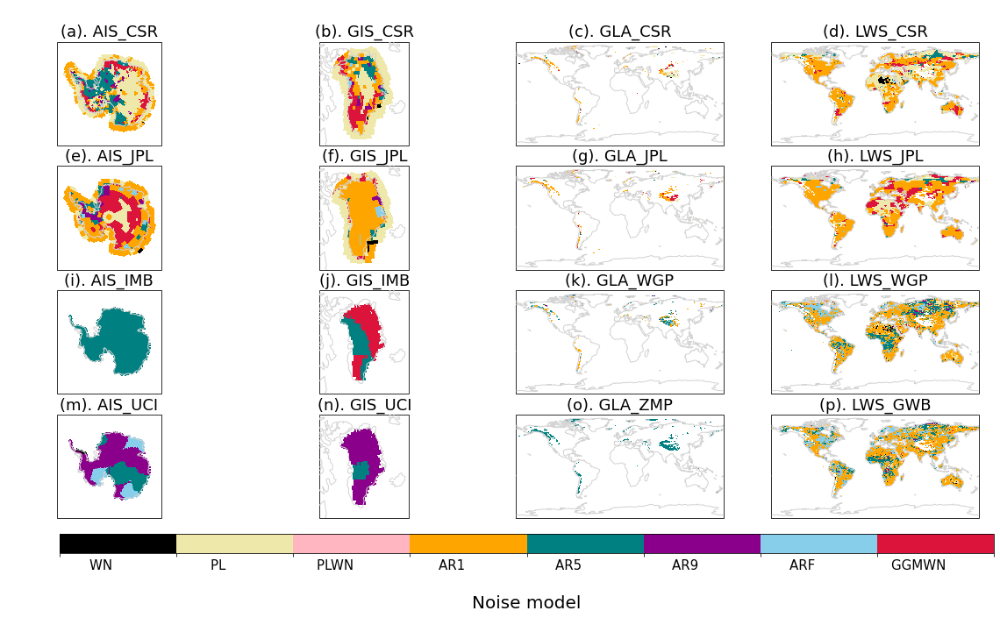

In [5]:
#%% fig 1 

fig = plt.figure(figsize=(wi, hi), 
                 facecolor='w')
nrows=4
ncols=4

gs = GridSpec(nrows, ncols)
alpha=0.9
names=['AIS_CSR', 'GIS_CSR', 'GLA_CSR','LWS_CSR',
       'AIS_JPL', 'GIS_JPL', 'GLA_JPL','LWS_JPL',
        'AIS_IMB', 'GIS_IMB','GLA_WGP','LWS_WGP',
       'AIS_UCI', 'GIS_UCI','GLA_ZMP','LWS_GWB' ]

for iname,name in enumerate(names):
    da=ds.sel(name=name)
    reg = name.split('_')[0]
    if reg=='AIS':
        ext = [-180, 180, -90, -60]
        proj = ccrs.SouthPolarStereo()
       
    elif reg=='GIS':
        ext = [-65, -20, 57, 86]
        proj = ccrs.Stereographic(
                                central_latitude=90.0,
                                central_longitude=-45.0,
                                false_easting=0.0,
                                false_northing=0.0,
                                true_scale_latitude=70.0,
                                globe=ccrs.Globe('WGS84') )
        
    else:
        proj = ccrs.PlateCarree()
    
    ax1 = plt.subplot(gs[iname], 
                            projection=proj)
    ax1.coastlines(resolution='110m', zorder=3,color='lightgray')

    # print(reg + ' '+str(ipanel+irow))
    plt.title('\n({}). '.format(letters[iname])+name,fontsize=18)
    # if ifile ==0:
    #     plt.title(panel)
    if reg =="AIS" or reg =='GIS':
         ax1.set_extent(ext, ccrs.PlateCarree())
         
    ic_idx=-1
    cmin=0;cmax=8
    data = np.array(da.nm_sel[:,:])
    cp_nm = plt.pcolormesh(lon,lat,data,
                            #shading='flat',
                            cmap=cmapnm,
                           vmin=cmin,vmax=cmax,
                                #extent=(0,1,0,1), origin='lower',
                            transform=ccrs.PlateCarree()
                           )



    #% %
xmin, xmax = ax1.get_xbound()
ymin, ymax = ax1.get_ybound()
y2x_ratio = (ymax-ymin)/(xmax-xmin) * nrows/ncols
x2y_ratio = (xmax-xmin)/(ymax-ymin) * nrows/ncols

# Apply new h/w aspect ratio by changing h
# Also possible to change w using set_figwidth()
fig.set_figheight(wi * y2x_ratio)
# fig.set_figwidth(15)
    #% %
cbar_ax1 = fig.add_axes([0.17, 0.07, 0.74, 0.03])
cbar=fig.colorbar(cp_nm, cax=cbar_ax1,orientation='horizontal')
cbar.set_label(label='\nNoise model',size=20)
label=['                    {}'.format(nm) for nm in np.array(ds.nm)]
cbar.ax.set_xticklabels(label,fontsize=15,rotation=0)
#% %
plt.show()

Figure 2

In [6]:
kurs=path_to_figures+'fig02-tmp.png'
        
fig.savefig(kurs,format='png',dpi=300,bbox_inches='tight')

Colorbar size and spacing between columns adjusted manually on PPT. 

# Figure 3 - Temporal Uncertainty and Trend

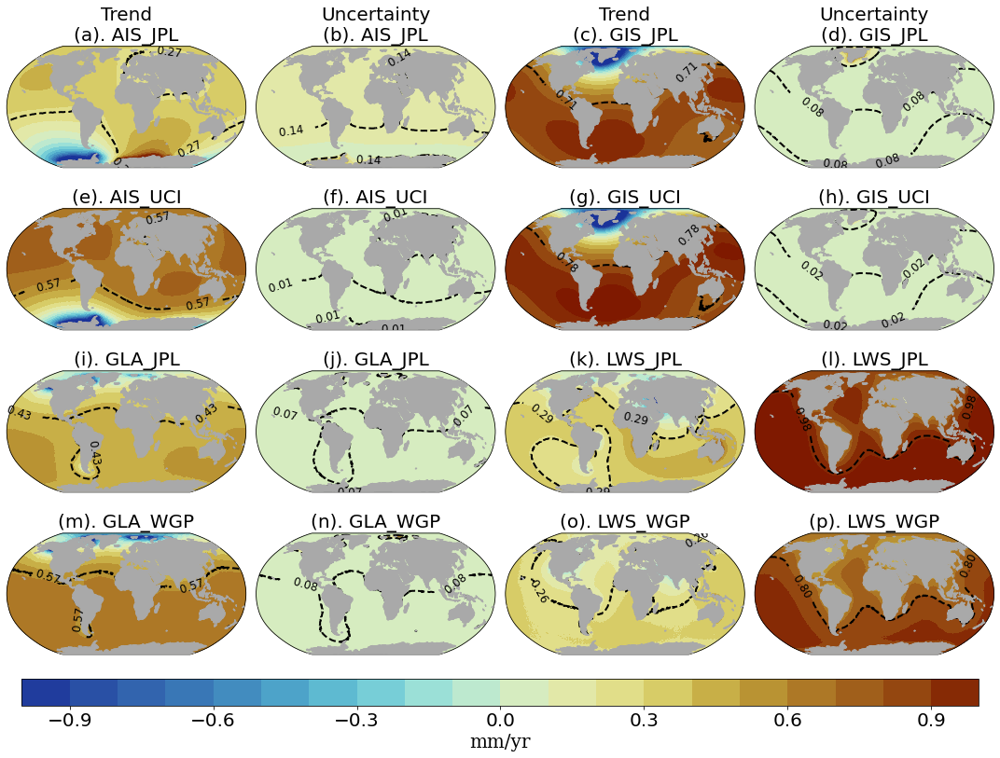

In [7]:
nrows=4
ncols=4
fig = plt.figure(figsize=(15,10), facecolor='w')
interval=0.1

gs = GridSpec(nrows, ncols)
irow = 0

alpha=0.9

regions = ['AIS','GIS','GLA','LWS']
combos= ['JPL','UCI+WGP']
panels=['Trend', 'Uncertainty']
name_list = ['AIS_JPL','GIS_JPL',
             'AIS_UCI','GIS_UCI',
             'GLA_JPL','LWS_JPL',
             'GLA_WGP','LWS_WGP']
# ncols=len(panels)
iletter=0
for iname, name in enumerate(name_list):
    da=ds.sel(name=name)
    
    proj = ccrs.Robinson()
    for ipanel, panel in enumerate(panels):
        # print(icol)
        # print(col)
        ax1 = plt.subplot(gs[ipanel+irow], 
                                projection=proj)
        ax1.coastlines(resolution='110m', zorder=3,color=landcolor)
        ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                    zorder=3)
        ax1.set_global() 

        if irow==0 or irow==2:
            plt.title(#'{}\n{}'.format(panel,name),
                      '{}\n({}). {}'.format(panel,letters[iletter],name),
                      fontsize=20)
        else:
            plt.title('\n({}). '.format(letters[iletter])+name,fontsize=20)
        iletter=iletter+1
            
        ic_idx=-1
        if ipanel == 0 or ipanel==2:
            Y=np.array(-lat);X=np.array(lon);X[0]=0;X[-1]=360
            clim=1
            cmap=cmf.roma_r
            data = np.array(da.trend[:,:])  


            mu,glb,mask=om.reg_to_glb(data,Y,X)
            glb=np.round(glb,3)
            cmin=-clim;cmax=clim
            cs=ax1.contour(X,Y,data,levels=[glb],
                    # vmin=-0.6,
                    # vmax=0.6,
                transform = ccrs.PlateCarree(),
                #cmap='coolwarm',#extend='both'
                colors=('black',),linestyles=('--',),linewidths=(2,)
                )
            lv=np.arange(cmin,cmax+interval,interval)
            csf=plt.contourf(X,Y,data,levels=lv,
                      transform = ccrs.PlateCarree(),cmap=cmap)
            ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)

            plt.pcolormesh(X,Y,data,
                    vmin=cmin,vmax=cmax,
                    zorder=0,
                    transform = ccrs.PlateCarree(),cmap=cmap)

        else:
            data = np.abs(da.uncs[0,:,:])

            clim=1
            cmap=cmf.roma_r
            mu,glb,mask=om.reg_to_glb(data,Y,X)
            glb=np.round(glb,3)
            cmin=-clim;cmax=clim
           
            cs=ax1.contour(X,Y,data,levels=[glb],
                    # vmin=-0.6,
                    # vmax=0.6,
                transform = ccrs.PlateCarree(),
                #cmap='coolwarm',#extend='both'
                colors=('black',),linestyles=('--',),linewidths=(2,)
                )
            lv=np.arange(cmin,cmax+interval,interval)
            csf=plt.contourf(X,Y,data,levels=lv,
                      transform = ccrs.PlateCarree(),cmap=cmap)
            ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)

            cp2=plt.pcolormesh(X,Y,data,
                    vmin=cmin,vmax=cmax,
                    zorder=0,
                    transform = ccrs.PlateCarree(),cmap=cmap)
    irow = irow+len(panels)
           

# xmin, xmax = ax1.get_xprop()
# ymin, ymax = ax1.get_yprop()
# y2x_ratio = (ymax-ymin)/(xmax-xmin) * nrows/ncols
# fig.set_figheight(wi * y2x_ratio + 5)

# fig.subplots_adjust(right=0.8)

plt.tight_layout()
# # fig.subplots_adjust(right=0.8)
cbar_ax2 = fig.add_axes([0.025, -0.05, 0.95, 0.04])
cbar2=plt.colorbar(csf, cax=cbar_ax2,orientation='horizontal')
cbar2.set_label(label='mm/yr',size=ticksize, family='serif')    
cbar2.ax.tick_params(labelsize=ticksize) 

plt.show()

Figure 3

In [8]:
kurs=path_to_figures+'fig03.png'
        
fig.savefig(kurs,format='png',dpi=300,bbox_inches='tight')

## Supplementary - Trends and temporal unc for CSR, IMB, ZMP and GWB

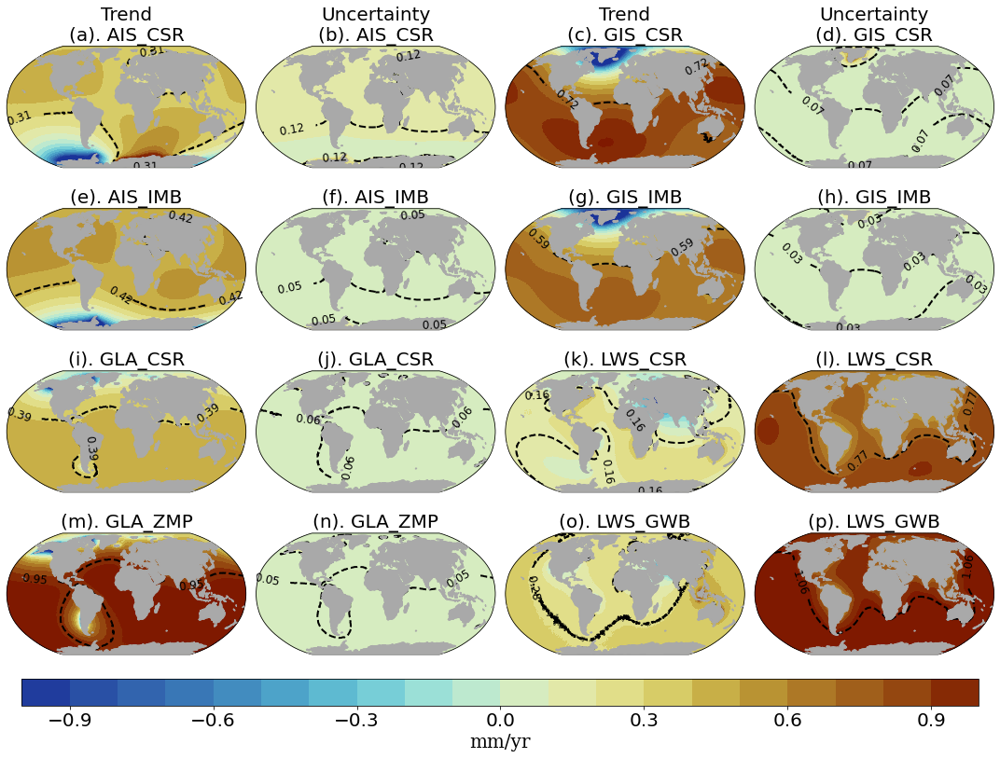

In [9]:
nrows=4
ncols=4
fig = plt.figure(figsize=(15,10), facecolor='w')
interval=0.1

gs = GridSpec(nrows, ncols)
irow = 0

alpha=0.9

regions = ['AIS','GIS','GLA','LWS']
combos= ['CSR','IMB+ZMP+GWB']
panels=['Trend', 'Uncertainty']
name_list = ['AIS_CSR','GIS_CSR',
             'AIS_IMB','GIS_IMB',
             'GLA_CSR','LWS_CSR',
             'GLA_ZMP','LWS_GWB']
# ncols=len(panels)
iletter=0
for iname, name in enumerate(name_list):
    da=ds.sel(name=name)
    
    proj = ccrs.Robinson()
    for ipanel, panel in enumerate(panels):
        # print(icol)
        # print(col)
        ax1 = plt.subplot(gs[ipanel+irow], 
                                projection=proj)
        ax1.coastlines(resolution='110m', zorder=3,color=landcolor)
        ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                    zorder=3)
        ax1.set_global() 

        if irow==0 or irow==2:
            plt.title(#'{}\n{}'.format(panel,name),
                      '{}\n({}). {}'.format(panel,letters[iletter],name),
                      fontsize=20)
        else:
            plt.title('\n({}). '.format(letters[iletter])+name,fontsize=20)
        iletter=iletter+1
            
        ic_idx=-1
        if ipanel == 0 or ipanel==2:
            Y=np.array(-lat);X=np.array(lon);X[0]=0;X[-1]=360
            clim=1
            cmap=cmf.roma_r
            data = np.array(da.trend[:,:])  


            mu,glb,mask=om.reg_to_glb(data,Y,X)
            glb=np.round(glb,3)
            cmin=-clim;cmax=clim
            cs=ax1.contour(X,Y,data,levels=[glb],
                    # vmin=-0.6,
                    # vmax=0.6,
                transform = ccrs.PlateCarree(),
                #cmap='coolwarm',#extend='both'
                colors=('black',),linestyles=('--',),linewidths=(2,)
                )
            lv=np.arange(cmin,cmax+interval,interval)
            csf=plt.contourf(X,Y,data,levels=lv,
                      transform = ccrs.PlateCarree(),cmap=cmap)
            ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)

            plt.pcolormesh(X,Y,data,
                    vmin=cmin,vmax=cmax,
                    zorder=0,
                    transform = ccrs.PlateCarree(),cmap=cmap)

        else:
            data = np.abs(da.uncs[0,:,:])

            clim=1
            cmap=cmf.roma_r
            mu,glb,mask=om.reg_to_glb(data,Y,X)
            glb=np.round(glb,3)
            cmin=-clim;cmax=clim
           
            cs=ax1.contour(X,Y,data,levels=[glb],
                    # vmin=-0.6,
                    # vmax=0.6,
                transform = ccrs.PlateCarree(),
                #cmap='coolwarm',#extend='both'
                colors=('black',),linestyles=('--',),linewidths=(2,)
                )
            lv=np.arange(cmin,cmax+interval,interval)
            csf=plt.contourf(X,Y,data,levels=lv,
                      transform = ccrs.PlateCarree(),cmap=cmap)
            ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)

            cp2=plt.pcolormesh(X,Y,data,
                    vmin=cmin,vmax=cmax,
                    zorder=0,
                    transform = ccrs.PlateCarree(),cmap=cmap)
    irow = irow+len(panels)
           

# xmin, xmax = ax1.get_xprop()
# ymin, ymax = ax1.get_yprop()
# y2x_ratio = (ymax-ymin)/(xmax-xmin) * nrows/ncols
# fig.set_figheight(wi * y2x_ratio + 5)

# fig.subplots_adjust(right=0.8)

plt.tight_layout()
# # fig.subplots_adjust(right=0.8)
cbar_ax2 = fig.add_axes([0.025, -0.05, 0.95, 0.04])

cbar2=plt.colorbar(csf, cax=cbar_ax2,orientation='horizontal')
cbar2.set_label(label='mm/yr',size=ticksize, family='serif')    
cbar2.ax.tick_params(labelsize=ticksize) 

plt.show()

Figure A1

In [10]:
kurs=path_to_figures+'figA2.png'
        
fig.savefig(kurs,format='png',dpi=300,bbox_inches='tight')

# Figure 4 - Spatial Uncertainty

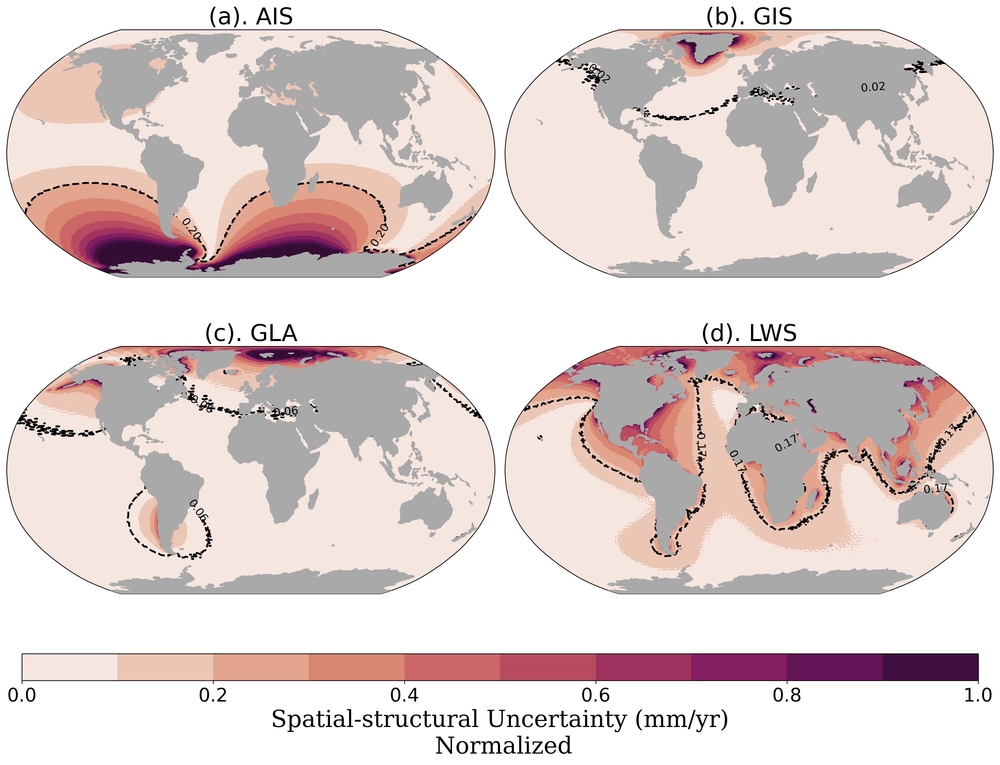

In [11]:
clim=1
cmap=cmap_unc
c0=0
cmin=0
cmap = cm.tools.crop(cmap, cmin,cmax,c0)

cmax=clim
interval=0.1

X[-1]=360
# spatial unc is the same for all AIS, GIS, LWS and GLA (no matter the dataset)
names=[name for name in np.array(ds.name) if name.split('_')[1]=='CSR']

fig = plt.figure(figsize=(15,10), facecolor='w',dpi=dpi)
for iname, name in enumerate(names):
    da=ds.sel(name=[name])
    data = np.array(da.spatial_unc_norm[0,:,:])
    ax1 = plt.subplot(2,2,iname+1, projection=ccrs.Robinson())
    
    ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
    ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                    zorder=3)
    ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
    
    lv=np.arange(cmin,cmax+interval,interval)
    csf=plt.contourf(X,Y,np.abs(data),levels=lv,
              transform = ccrs.PlateCarree(),cmap=cmap)
    mu,glb,mask=om.reg_to_glb(data,Y,X)
    glb=np.round(glb,2)
 
    cs=ax1.contour(X,Y,data,
                   levels=[glb],
               # levels=[0.15, 0.30, 0.45, 0.6, 0.75],
            # vmin=-0.6,
            # vmax=0.6,
        transform = ccrs.PlateCarree(),
        #cmap='coolwarm',#extend='both'
        colors=('black',),linestyles=('--',),linewidths=(2,)
        )   
    ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)
    
    cp=plt.pcolormesh(X,Y,data,
                vmin=cmin,vmax=cmax,
                zorder=0,
                transform = ccrs.PlateCarree(),cmap=cmap)
    ax1.set_title('({}). '.format(letters[iname])+str(name).split('_')[0],size=fontsize)    

    
plt.tight_layout()
cbar_ax2 = fig.add_axes([0.025, -0.05, 0.95, 0.04])
cbar2 = plt.colorbar(csf, cax=cbar_ax2, orientation='horizontal')
cbar2.set_label(label='Spatial-structural Uncertainty (mm/yr)\n Normalized',size=fontsize, family='serif')
cbar2.ax.tick_params(labelsize=ticksize) 

plt.show()
    

Figure 4

In [12]:
fig.savefig(path_to_figures+'fig04.png',
            format='png',dpi=300,bbox_inches='tight')


plt.close()

# Figure 5 - Intrinsic Uncertainity

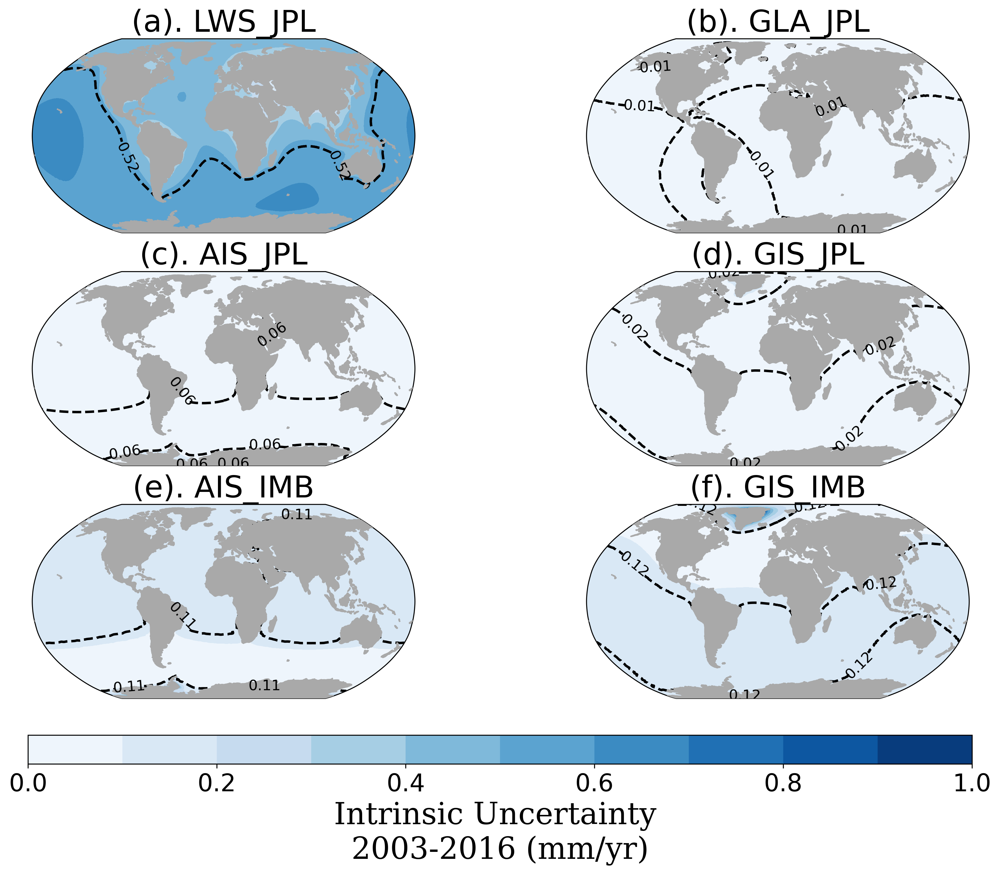

In [13]:
names = ['LWS_JPL','GLA_JPL','AIS_JPL','GIS_JPL','AIS_IMB','GIS_IMB']

#% % plot
clim=1
cmap='Blues'
cmin=0
cmax=clim
interval = 0.1
fig = plt.figure(figsize=(15,10), facecolor='w',dpi=dpi)

for iname,name in enumerate(names):
    da=ds.sel(name=name)
    # print(name)
    ax1 = plt.subplot(3,2,iname+1, projection=ccrs.Robinson())
    da=ds.sel(name=name)

    # SLF monthly then trend:
    data=np.array(da.uncs[2,:,:])
#    print(np.nanmin(data))
#    print(np.nanmax(data))
    ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
    ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                     zorder=3)
    ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
    
    # make it discrete
      
    lv=np.arange(cmin,cmax+interval,interval)
    csf=plt.contourf(X,Y,np.abs(data),levels=lv,
              transform = ccrs.PlateCarree(),cmap=cmap)

    mu,glb,mask=om.reg_to_glb(data,Y,X)
    glb=np.round(glb,3)
 
    cs=ax1.contour(X,Y,data,
                   levels=[glb],
               # levels=[0.15, 0.30, 0.45, 0.6, 0.75],
            # vmin=-0.6,
            # vmax=0.6,
        transform = ccrs.PlateCarree(),
        #cmap='coolwarm',#extend='both'
        colors=('black',),linestyles=('--',),linewidths=(2,)
        )   
    # ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)
    ax1.clabel(cs,cs.levels,fmt='{}'.format(np.round(glb,2)),colors='k',fontsize=12)

    cp=plt.pcolormesh(X,Y,np.abs(data),
                vmin=cmin,vmax=cmax,
                zorder=0,
                transform = ccrs.PlateCarree(),cmap=cmap)
    ax1.set_title('({}). '.format(letters[iname])+str(name),size=fontsize)    


cbar_ax2 = fig.add_axes([0.152, 0.05, 0.72, 0.033])
# cbar_ax2 = fig.add_axes([0.025, -0.05, 0.95, 0.04])
cbar2 = plt.colorbar(csf, cax=cbar_ax2, orientation='horizontal')
cbar2.set_label(label='Intrinsic Uncertainty \n{}-{} (mm/yr)'.format(t0,t1),size=fontsize, family='serif')
cbar2.ax.tick_params(labelsize=ticksize) 

plt.show()

Figure 5

In [14]:
fig.savefig(path_to_figures+'fig05.png',
            format='png',dpi=300,bbox_inches='tight')

plt.close()

# Figure 6 - Total Barystatic Uncertainty

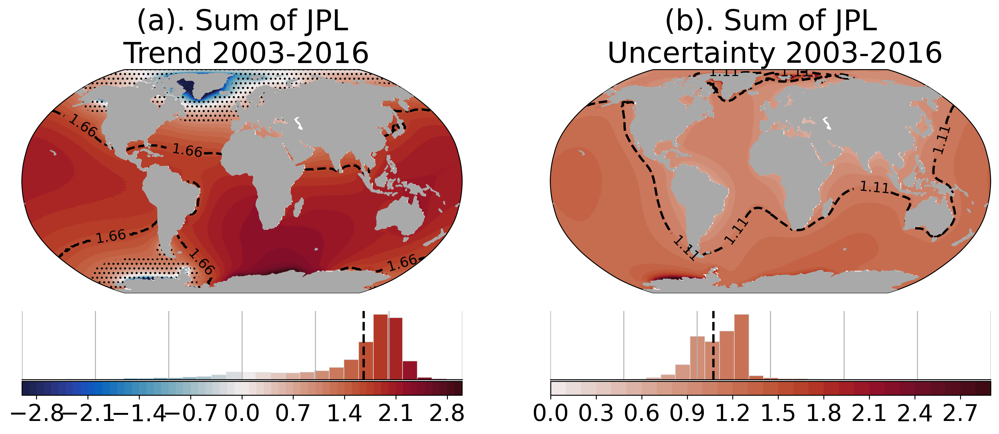

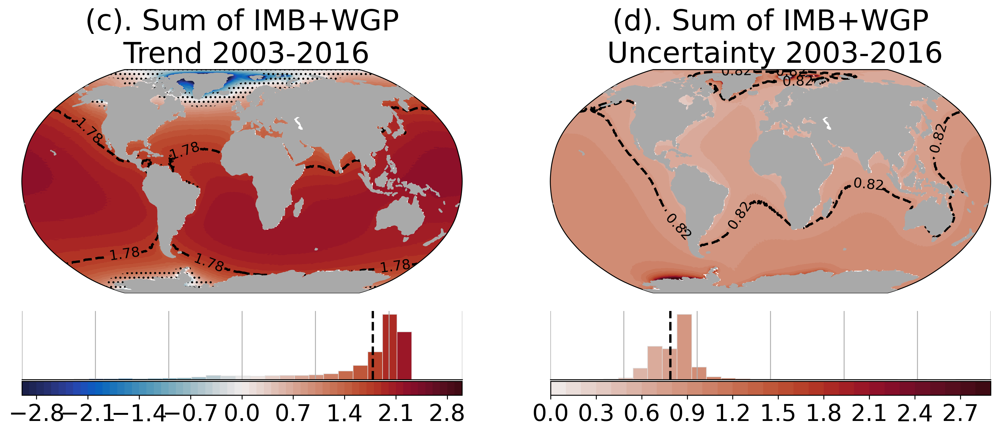

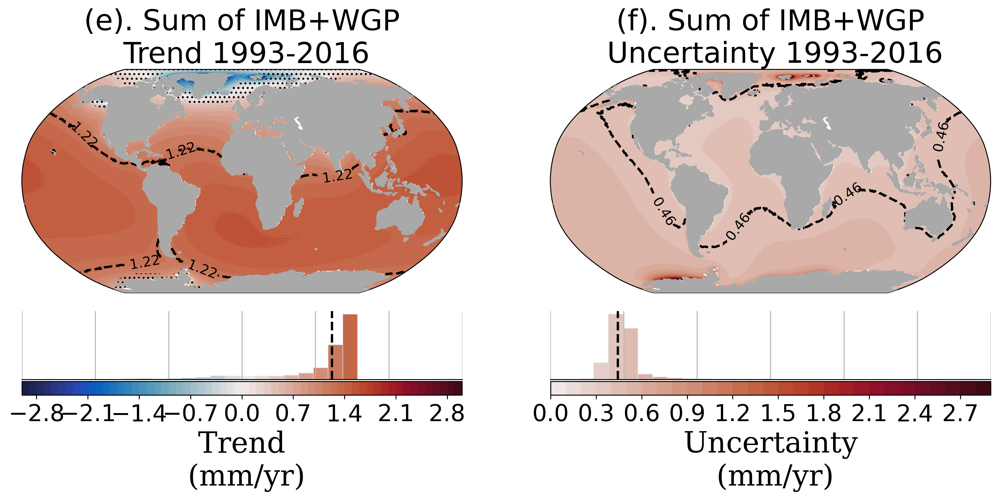

In [15]:

combos = [['JPL'],
          # ['CSR'],
          ['IMB','WGP'],
         # ['IMB','GWB','ZMP'],['UCI','WGP'],['UCI','GWB','ZMP']
         ]
reconstr =['JPL',
#            'CSR',
           'IMB+WGP',
           #'IMB+GWB+ZMP','UCI+WGP','UCI+GWB+ZMP'
          ]
i=0
j=0
cmax_unc = 3
c0=0
interval=0.1
ipanel=1
for title,combo in zip(reconstr,combos):
    
    #% %
    names=[name for name in np.array(ds.name) for comb in combo if name.split('_')[1]==comb ]
    trend=np.nansum(np.array(ds.trend.sel(name=names)),axis=0)
    unc=om.quadrsum(np.array(ds.unc_total.sel(name=names)))
    grid_area=om.get_grid_area(np.zeros((trend.shape)))
    
    area=np.hstack(grid_area)
    
    alpha=1

    clim=3
    bw=0.1 # bin width
    cmap=cm.cm.balance
    cmin=-clim
    cmax=clim
    fig = plt.figure(figsize=(15,5), facecolor='w',dpi=dpi)

    Z=np.array(trend) * oceanmask
    ax1 = plt.subplot2grid((4, 2), (0, 0), rowspan=3,projection=ccrs.Robinson())
    ax1.set_title('({}). '.format(letters[j])+'Sum of {}\n Trend {}-{}'.format(title,t0,t1),fontsize=fontsize)
    ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
    ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                    zorder=3)
    ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
    
    
    mu,glb,mask=om.reg_to_glb(Z,Y,X)
    glb=np.round(glb,3)

    cs=ax1.contour(X,Y,Z,levels=[glb],
            # vmin=-0.6,
            # vmax=0.6,
        transform = ccrs.PlateCarree(),
        #cmap='coolwarm',#extend='both'
        colors=('black',),linestyles=('--',),linewidths=(2,)
        )
    lv=np.arange(cmin,cmax+interval,interval)
    csf0=plt.contourf(X,Y,Z,levels=lv,
              transform = ccrs.PlateCarree(),cmap=cmap)
    ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)
    
    
    cp0=plt.pcolormesh(X,Y,Z,
                vmin=cmin,vmax=cmax,
                zorder=0,
                transform = ccrs.PlateCarree(),cmap=cmap)
    #ax1.set_title(str(name),size=fontsize)    
    
    # stipple areas where trend is smaller then unc
    Z_insg = np.array(Z)
    Z_insg[np.abs(Z)<(np.array(unc) * oceanmask)]=1
    Z_insg[np.abs(Z)>(np.array(unc) * oceanmask)]=0
    
    stip = plt.contourf(X,Y, Z_insg, levels=[ -1,0, 1],
                    colors='none', hatches=[None,'...'], 
                    transform = ccrs.PlateCarree(),zorder=10)
    
    ax2 = plt.subplot2grid((4,2), (3, 0))
    
    d=np.hstack(Z)
    # equal_area = [np.repeat(d[i],np.round(area[i]/1)) for i in range(1,len(d)) ]
    # equal_area = np.concatenate( equal_area, axis=0 )
    # d=equal_area
    bins= np.arange(np.nanmin(d)-1,np.nanmax(d)+1,0.2)
    
    n, bins, patches = plt.hist(d,bins=bins, # bins=int(rg/bw), 
                                density=True, 
                                facecolor='#2ab0ff', edgecolor='#e0e0e0', 
                                linewidth=0.5, alpha=alpha)
    
    
    #norm = colors.Normalize(0,1)
    norm = colors.Normalize(cmin,cmax)
    
    for bin,patch in zip(bins,patches):
        color=cmap(norm(bin))
        patch.set_facecolor(color)
    ax2.set_xlim(cmin,cmax)
    plt.axvline(glb, color='k', linestyle='dashed', linewidth=2)
    
    
    ax2.tick_params(left = False, right = False , labelleft = False ,
                    labelbottom = False, bottom = False)
    
    ax2.xaxis.grid() # horizontal lines
    ax2.spines['right'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    # Hide left
    ax2.spines['left'].set_visible(False)
    
    # UNC
    cmapnew = cm.tools.crop(cmap, c0,cmax_unc,c0)

    Z=np.array(unc) * oceanmask
    ax1 = plt.subplot2grid((4, 2), (0, 1), rowspan=3,projection=ccrs.Robinson())
    j=j+1
    ax1.set_title('({}). '.format(letters[j])+'Sum of {}\n Uncertainty {}-{}'.format(title,t0,t1),fontsize=fontsize)
    ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
    ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                    zorder=3)
    ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle

    mu,glb,mask=om.reg_to_glb(Z,Y,X)
    glb=np.round(glb,3)

    cs=ax1.contour(X,Y,Z,levels=[glb],
            # vmin=-0.6,
            # vmax=0.6,
        transform = ccrs.PlateCarree(),
        #cmap='coolwarm',#extend='both'
        colors=('black',),linestyles=('--',),linewidths=(2,)
        )
    lv=np.arange(c0,cmax_unc,0.1)
    csf=plt.contourf(X,Y,Z,levels=lv,
              transform = ccrs.PlateCarree(),cmap=cmapnew)
    ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)
    
    cp=plt.pcolormesh(X,Y,Z,
                vmin=c0,vmax=cmax_unc,
                zorder=0,
                transform = ccrs.PlateCarree(),cmap=cmapnew)
    #ax1.set_title(str(name),size=fontsize)    
    
    ax2 = plt.subplot2grid((4,2), (3, 1))
    
    d=np.hstack(Z)
    # equal_area = [np.repeat(d[i],np.round(area[i]/1)) for i in range(1,len(d)) ]
    # equal_area = np.concatenate( equal_area, axis=0 )
    # d=equal_area
    bins= np.arange(np.nanmin(d)-1,np.nanmax(d)+1,0.1)
    
    n, bins, patches = plt.hist(d,bins=bins, # bins=int(rg/bw), 
                                density=True, 
                                facecolor='#2ab0ff', edgecolor='#e0e0e0', 
                                linewidth=0.5, alpha=alpha)
    
    
    #norm = colors.Normalize(0,1)
    norm = colors.Normalize(c0,cmax_unc)
    
    for bin,patch in zip(bins,patches):
        color=cmapnew(norm(bin))
        patch.set_facecolor(color)
    ax2.set_xlim(c0,cmax_unc)
    plt.axvline(glb, color='k', linestyle='dashed', linewidth=2)
    
    ax2.tick_params(left = False, right = False , labelleft = False ,
                    labelbottom = False, bottom = False)
    
    ax2.xaxis.grid() # horizontal lines
    ax2.spines['right'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    # Hide left
    ax2.spines['left'].set_visible(False)
    
    
    cbar_ax2 = fig.add_axes([0.125, 0.0875, 0.352, 0.033])
    cbar2 = plt.colorbar(csf0, cax=cbar_ax2, orientation='horizontal')
    # if i==1:
        # cbar2.set_label(label='Trend\n (mm/yr)',size=fontsize, family='serif')
    cbar2.ax.tick_params(labelsize=ticksize) 

    cbar_ax2 = fig.add_axes([0.548, 0.0875, 0.352, 0.033])
    cbar2 = plt.colorbar(csf, cax=cbar_ax2, orientation='horizontal')
    # if i==1:
        # cbar2.set_label(label='Uncertainty\n (mm/yr)',size=fontsize, family='serif')
    cbar2.ax.tick_params(labelsize=ticksize) 
    
    plt.show()

    
    i=i+1
    j=j+1

    
    fig.savefig(path_to_figures+'fig06-panel{}.png'.format(ipanel),
                format='png',dpi=300,bbox_inches='tight')
    ipanel=ipanel+1

trend=np.nansum(np.array(ds_a.trend.sel(name=names)),axis=0)
unc=om.quadrsum(np.array(ds_a.unc_total.sel(name=names)))
grid_area=om.get_grid_area(np.zeros((trend.shape)))

area=np.hstack(grid_area)

alpha=1
clim=3
bw=0.1 # bin width
cmap=cm.cm.balance
cmin=-clim
cmax=clim
fig = plt.figure(figsize=(15,5), facecolor='w',dpi=dpi)

Z=np.array(trend) * oceanmask
ax1 = plt.subplot2grid((4, 2), (0, 0), rowspan=3,projection=ccrs.Robinson())
ax1.set_title('({}). '.format(letters[j])+'Sum of {}\n Trend {}-{}'.format(title,t0_a,t1_a-1),fontsize=fontsize)
ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                zorder=3)
ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle


mu,glb,mask=om.reg_to_glb(Z,Y,X)
glb=np.round(glb,3)

cs=ax1.contour(X,Y,Z,levels=[glb],
        # vmin=-0.6,
        # vmax=0.6,
    transform = ccrs.PlateCarree(),
    #cmap='coolwarm',#extend='both'
    colors=('black',),linestyles=('--',),linewidths=(2,)
    )
lv=np.arange(cmin,cmax+interval,interval)
csf0=plt.contourf(X,Y,Z,levels=lv,
          transform = ccrs.PlateCarree(),cmap=cmap)
ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)


cp0=plt.pcolormesh(X,Y,Z,
            vmin=cmin,vmax=cmax,
            zorder=0,
            transform = ccrs.PlateCarree(),cmap=cmap)
#ax1.set_title(str(name),size=fontsize)    

# stipple areas where trend is smaller then unc
Z_insg = np.array(Z)
Z_insg[np.abs(Z)<(np.array(unc) * oceanmask)]=1
Z_insg[np.abs(Z)>(np.array(unc) * oceanmask)]=0

stip = plt.contourf(X,Y, Z_insg, levels=[ -1,0, 1],
                colors='none', hatches=[None,'...'], 
                transform = ccrs.PlateCarree(),zorder=10)

ax2 = plt.subplot2grid((4,2), (3, 0))

d=np.hstack(Z)
# equal_area = [np.repeat(d[i],np.round(area[i]/1)) for i in range(1,len(d)) ]
# equal_area = np.concatenate( equal_area, axis=0 )
# d=equal_area
bins= np.arange(np.nanmin(d)-1,np.nanmax(d)+1,0.2)

n, bins, patches = plt.hist(d,bins=bins, # bins=int(rg/bw), 
                            density=True, 
                            facecolor='#2ab0ff', edgecolor='#e0e0e0', 
                            linewidth=0.5, alpha=alpha)


#norm = colors.Normalize(0,1)
norm = colors.Normalize(cmin,cmax)

for bin,patch in zip(bins,patches):
    color=cmap(norm(bin))
    patch.set_facecolor(color)
ax2.set_xlim(cmin,cmax)
plt.axvline(glb, color='k', linestyle='dashed', linewidth=2)
    

ax2.tick_params(left = False, right = False , labelleft = False ,
                labelbottom = False, bottom = False)

ax2.xaxis.grid() # horizontal lines
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
# Hide left
ax2.spines['left'].set_visible(False)

# UNC
cmapnew = cm.tools.crop(cmap, c0,cmax_unc,c0)

Z=np.array(unc) * oceanmask
ax1 = plt.subplot2grid((4, 2), (0, 1), rowspan=3,projection=ccrs.Robinson())
j=j+1
ax1.set_title('({}). '.format(letters[j])+'Sum of {}\n Uncertainty {}-{}'.format(title,t0_a,t1_a-1),fontsize=fontsize)
ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                zorder=3)
ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle

mu,glb,mask=om.reg_to_glb(Z,Y,X)
glb=np.round(glb,3)

cs=ax1.contour(X,Y,Z,levels=[glb],
        # vmin=-0.6,
        # vmax=0.6,
    transform = ccrs.PlateCarree(),
    #cmap='coolwarm',#extend='both'
    colors=('black',),linestyles=('--',),linewidths=(2,)
    )
lv=np.arange(c0,cmax_unc,0.1)
csf=plt.contourf(X,Y,Z,levels=lv,
          transform = ccrs.PlateCarree(),cmap=cmapnew)
ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)

cp=plt.pcolormesh(X,Y,Z,
            vmin=c0,vmax=cmax_unc,
            zorder=0,
            transform = ccrs.PlateCarree(),cmap=cmapnew)
#ax1.set_title(str(name),size=fontsize)    

ax2 = plt.subplot2grid((4,2), (3, 1))

d=np.hstack(Z)
# equal_area = [np.repeat(d[i],np.round(area[i]/1)) for i in range(1,len(d)) ]
# equal_area = np.concatenate( equal_area, axis=0 )
# d=equal_area
bins= np.arange(np.nanmin(d)-1,np.nanmax(d)+1,0.1)

n, bins, patches = plt.hist(d,bins=bins, # bins=int(rg/bw), 
                            density=True, 
                            facecolor='#2ab0ff', edgecolor='#e0e0e0', 
                            linewidth=0.5, alpha=alpha)


#norm = colors.Normalize(0,1)
norm = colors.Normalize(c0,cmax_unc)

for bin,patch in zip(bins,patches):
    color=cmapnew(norm(bin))
    patch.set_facecolor(color)
ax2.set_xlim(c0,cmax_unc)

plt.axvline(glb, color='k', linestyle='dashed', linewidth=2)
    
ax2.tick_params(left = False, right = False , labelleft = False ,
                labelbottom = False, bottom = False)

ax2.xaxis.grid() # horizontal lines
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
# Hide left
ax2.spines['left'].set_visible(False)


cbar_ax2 = fig.add_axes([0.125, 0.0875, 0.352, 0.033])
cbar2 = plt.colorbar(csf0, cax=cbar_ax2, orientation='horizontal')
cbar2.set_label(label='Trend\n (mm/yr)',size=fontsize, family='serif')
cbar2.ax.tick_params(labelsize=ticksize) 

cbar_ax2 = fig.add_axes([0.548, 0.0875, 0.352, 0.033])
cbar2 = plt.colorbar(csf, cax=cbar_ax2, orientation='horizontal')
cbar2.set_label(label='Uncertainty\n (mm/yr)',size=fontsize, family='serif')
cbar2.ax.tick_params(labelsize=ticksize) 

fig.savefig(path_to_figures+'fig06-panel{}.png'.format(ipanel),
                format='png',dpi=300,bbox_inches='tight')


Subplot rows combined manually on PPT

Figure 6

## SI - Total Barystatic for CSR, UCI+GWB+ZMP

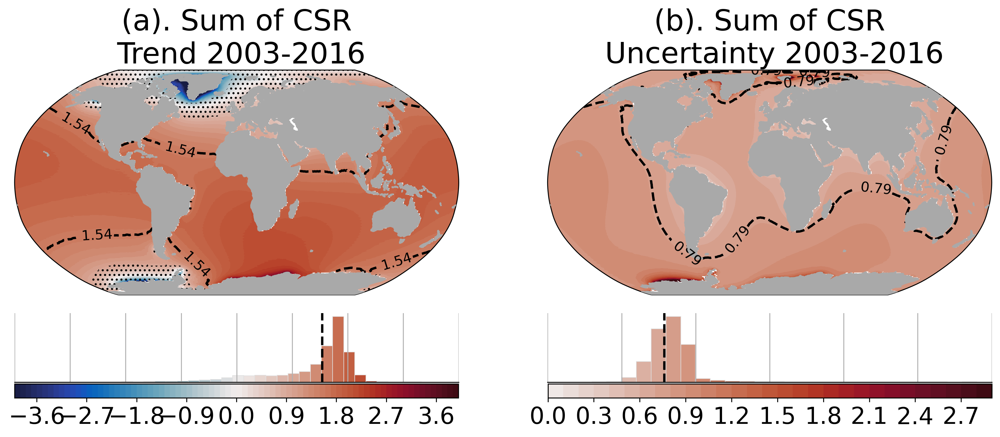

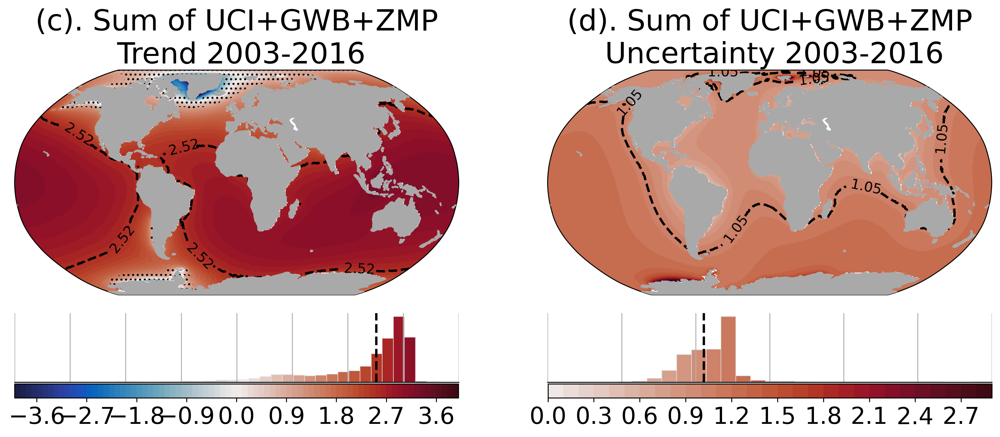

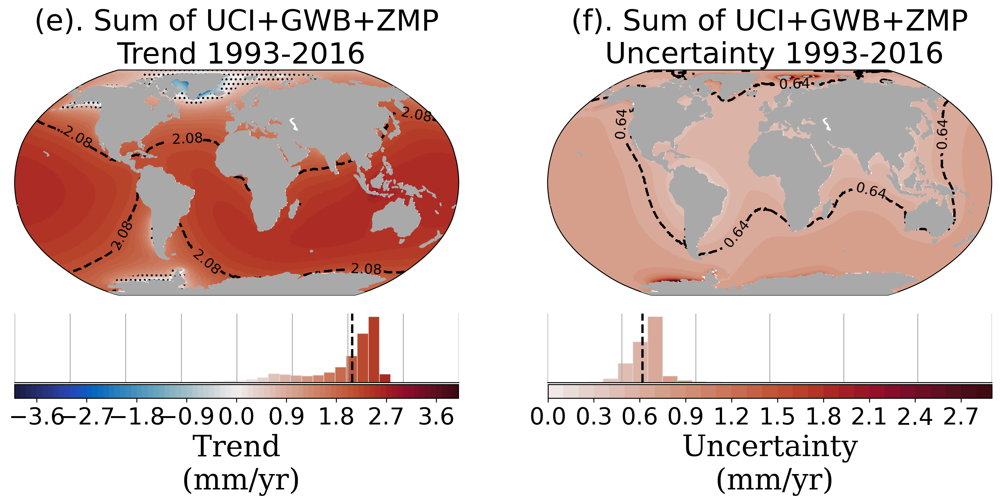

In [16]:

combos = [#['JPL'],
           ['CSR'],
          #['IMB','WGP'],
         # ['IMB','GWB','ZMP'],['UCI','WGP'],
        ['UCI','GWB','ZMP']
         ]
reconstr =[#'JPL',
            'CSR',
           #'IMB+WGP',
           #'IMB+GWB+ZMP','UCI+WGP',
    'UCI+GWB+ZMP'
          ]
i=0
j=0
cmax_unc = 3
c0=0
interval=0.1
ipanel=1
for title,combo in zip(reconstr,combos):
    
    #% %
    names=[name for name in np.array(ds.name) for comb in combo if name.split('_')[1]==comb ]
    trend=np.nansum(np.array(ds.trend.sel(name=names)),axis=0)
    unc=om.quadrsum(np.array(ds.unc_total.sel(name=names)))
    grid_area=om.get_grid_area(np.zeros((trend.shape)))
    
    area=np.hstack(grid_area)
    
    alpha=1

    clim=4
    bw=0.1 # bin width
    cmap=cm.cm.balance
    cmin=-clim
    cmax=clim
    fig = plt.figure(figsize=(15,5), facecolor='w',dpi=dpi)

    Z=np.array(trend) * oceanmask
    ax1 = plt.subplot2grid((4, 2), (0, 0), rowspan=3,projection=ccrs.Robinson())
    ax1.set_title('({}). '.format(letters[j])+'Sum of {}\n Trend {}-{}'.format(title,t0,t1),fontsize=fontsize)
    ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
    ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                    zorder=3)
    ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle
    
    
    mu,glb,mask=om.reg_to_glb(Z,Y,X)
    glb=np.round(glb,3)

    cs=ax1.contour(X,Y,Z,levels=[glb],
            # vmin=-0.6,
            # vmax=0.6,
        transform = ccrs.PlateCarree(),
        #cmap='coolwarm',#extend='both'
        colors=('black',),linestyles=('--',),linewidths=(2,)
        )
    lv=np.arange(cmin,cmax+interval,interval)
    csf0=plt.contourf(X,Y,Z,levels=lv,
              transform = ccrs.PlateCarree(),cmap=cmap)
    ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)
    
    
    cp0=plt.pcolormesh(X,Y,Z,
                vmin=cmin,vmax=cmax,
                zorder=0,
                transform = ccrs.PlateCarree(),cmap=cmap)
    #ax1.set_title(str(name),size=fontsize)    
    
    # stipple areas where trend is smaller then unc
    Z_insg = np.array(Z)
    Z_insg[np.abs(Z)<(np.array(unc) * oceanmask)]=1
    Z_insg[np.abs(Z)>(np.array(unc) * oceanmask)]=0
    
    stip = plt.contourf(X,Y, Z_insg, levels=[ -1,0, 1],
                    colors='none', hatches=[None,'...'], 
                    transform = ccrs.PlateCarree(),zorder=10)
    
    ax2 = plt.subplot2grid((4,2), (3, 0))
    
    d=np.hstack(Z)
    # equal_area = [np.repeat(d[i],np.round(area[i]/1)) for i in range(1,len(d)) ]
    # equal_area = np.concatenate( equal_area, axis=0 )
    # d=equal_area
    bins= np.arange(np.nanmin(d)-1,np.nanmax(d)+1,0.2)
    
    n, bins, patches = plt.hist(d,bins=bins, # bins=int(rg/bw), 
                                density=True, 
                                facecolor='#2ab0ff', edgecolor='#e0e0e0', 
                                linewidth=0.5, alpha=alpha)
    
    
    #norm = colors.Normalize(0,1)
    norm = colors.Normalize(cmin,cmax)
    
    for bin,patch in zip(bins,patches):
        color=cmap(norm(bin))
        patch.set_facecolor(color)
    ax2.set_xlim(cmin,cmax)
    plt.axvline(glb, color='k', linestyle='dashed', linewidth=2)
    
    
    ax2.tick_params(left = False, right = False , labelleft = False ,
                    labelbottom = False, bottom = False)
    
    ax2.xaxis.grid() # horizontal lines
    ax2.spines['right'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    # Hide left
    ax2.spines['left'].set_visible(False)
    
    # UNC
    cmapnew = cm.tools.crop(cmap, c0,cmax_unc,c0)

    Z=np.array(unc) * oceanmask
    ax1 = plt.subplot2grid((4, 2), (0, 1), rowspan=3,projection=ccrs.Robinson())
    j=j+1
    ax1.set_title('({}). '.format(letters[j])+'Sum of {}\n Uncertainty {}-{}'.format(title,t0,t1),fontsize=fontsize)
    ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
    ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                    zorder=3)
    ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle

    mu,glb,mask=om.reg_to_glb(Z,Y,X)
    glb=np.round(glb,3)

    cs=ax1.contour(X,Y,Z,levels=[glb],
            # vmin=-0.6,
            # vmax=0.6,
        transform = ccrs.PlateCarree(),
        #cmap='coolwarm',#extend='both'
        colors=('black',),linestyles=('--',),linewidths=(2,)
        )
    lv=np.arange(c0,cmax_unc,0.1)
    csf=plt.contourf(X,Y,Z,levels=lv,
              transform = ccrs.PlateCarree(),cmap=cmapnew)
    ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)
    
    cp=plt.pcolormesh(X,Y,Z,
                vmin=c0,vmax=cmax_unc,
                zorder=0,
                transform = ccrs.PlateCarree(),cmap=cmapnew)
    #ax1.set_title(str(name),size=fontsize)    
    
    ax2 = plt.subplot2grid((4,2), (3, 1))
    
    d=np.hstack(Z)
    # equal_area = [np.repeat(d[i],np.round(area[i]/1)) for i in range(1,len(d)) ]
    # equal_area = np.concatenate( equal_area, axis=0 )
    # d=equal_area
    bins= np.arange(np.nanmin(d)-1,np.nanmax(d)+1,0.1)
    
    n, bins, patches = plt.hist(d,bins=bins, # bins=int(rg/bw), 
                                density=True, 
                                facecolor='#2ab0ff', edgecolor='#e0e0e0', 
                                linewidth=0.5, alpha=alpha)
    
    
    #norm = colors.Normalize(0,1)
    norm = colors.Normalize(c0,cmax_unc)
    
    for bin,patch in zip(bins,patches):
        color=cmapnew(norm(bin))
        patch.set_facecolor(color)
    ax2.set_xlim(c0,cmax_unc)
    plt.axvline(glb, color='k', linestyle='dashed', linewidth=2)
    
    ax2.tick_params(left = False, right = False , labelleft = False ,
                    labelbottom = False, bottom = False)
    
    ax2.xaxis.grid() # horizontal lines
    ax2.spines['right'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    # Hide left
    ax2.spines['left'].set_visible(False)
    
    
    cbar_ax2 = fig.add_axes([0.125, 0.0875, 0.352, 0.033])
    cbar2 = plt.colorbar(csf0, cax=cbar_ax2, orientation='horizontal')
    # if i==1:
        # cbar2.set_label(label='Trend\n (mm/yr)',size=fontsize, family='serif')
    cbar2.ax.tick_params(labelsize=ticksize) 

    cbar_ax2 = fig.add_axes([0.548, 0.0875, 0.352, 0.033])
    cbar2 = plt.colorbar(csf, cax=cbar_ax2, orientation='horizontal')
    # if i==1:
        # cbar2.set_label(label='Uncertainty\n (mm/yr)',size=fontsize, family='serif')
    cbar2.ax.tick_params(labelsize=ticksize) 
    
    plt.show()

    
    i=i+1
    j=j+1

    
    fig.savefig(path_to_figures+'figA2-panel{}.png'.format(ipanel),
                format='png',dpi=300,bbox_inches='tight')
    ipanel=ipanel+1

trend=np.nansum(np.array(ds_a.trend.sel(name=names)),axis=0)
unc=om.quadrsum(np.array(ds_a.unc_total.sel(name=names)))
grid_area=om.get_grid_area(np.zeros((trend.shape)))

area=np.hstack(grid_area)

alpha=1 
# clim=3
bw=0.1 # bin width
cmap=cm.cm.balance
cmin=-clim
cmax=clim
fig = plt.figure(figsize=(15,5), facecolor='w',dpi=dpi)

Z=np.array(trend) * oceanmask
ax1 = plt.subplot2grid((4, 2), (0, 0), rowspan=3,projection=ccrs.Robinson())
ax1.set_title('({}). '.format(letters[j])+'Sum of {}\n Trend {}-{}'.format(title,t0_a,t1_a-1),fontsize=fontsize)
ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                zorder=3)
ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle


mu,glb,mask=om.reg_to_glb(Z,Y,X)
glb=np.round(glb,3)

cs=ax1.contour(X,Y,Z,levels=[glb],
        # vmin=-0.6,
        # vmax=0.6,
    transform = ccrs.PlateCarree(),
    #cmap='coolwarm',#extend='both'
    colors=('black',),linestyles=('--',),linewidths=(2,)
    )
lv=np.arange(cmin,cmax+interval,interval)
csf0=plt.contourf(X,Y,Z,levels=lv,
          transform = ccrs.PlateCarree(),cmap=cmap)
ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)


cp0=plt.pcolormesh(X,Y,Z,
            vmin=cmin,vmax=cmax,
            zorder=0,
            transform = ccrs.PlateCarree(),cmap=cmap)
#ax1.set_title(str(name),size=fontsize)    

# stipple areas where trend is smaller then unc
Z_insg = np.array(Z)
Z_insg[np.abs(Z)<(np.array(unc) * oceanmask)]=1
Z_insg[np.abs(Z)>(np.array(unc) * oceanmask)]=0

stip = plt.contourf(X,Y, Z_insg, levels=[ -1,0, 1],
                colors='none', hatches=[None,'...'], 
                transform = ccrs.PlateCarree(),zorder=10)

ax2 = plt.subplot2grid((4,2), (3, 0))

d=np.hstack(Z)
# equal_area = [np.repeat(d[i],np.round(area[i]/1)) for i in range(1,len(d)) ]
# equal_area = np.concatenate( equal_area, axis=0 )
# d=equal_area
bins= np.arange(np.nanmin(d)-1,np.nanmax(d)+1,0.2)

n, bins, patches = plt.hist(d,bins=bins, # bins=int(rg/bw), 
                            density=True, 
                            facecolor='#2ab0ff', edgecolor='#e0e0e0', 
                            linewidth=0.5, alpha=alpha)


#norm = colors.Normalize(0,1)
norm = colors.Normalize(cmin,cmax)

for bin,patch in zip(bins,patches):
    color=cmap(norm(bin))
    patch.set_facecolor(color)
ax2.set_xlim(cmin,cmax)
plt.axvline(glb, color='k', linestyle='dashed', linewidth=2)
    

ax2.tick_params(left = False, right = False , labelleft = False ,
                labelbottom = False, bottom = False)

ax2.xaxis.grid() # horizontal lines
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
# Hide left
ax2.spines['left'].set_visible(False)

# UNC
cmapnew = cm.tools.crop(cmap, c0,cmax_unc,c0)

Z=np.array(unc) * oceanmask
ax1 = plt.subplot2grid((4, 2), (0, 1), rowspan=3,projection=ccrs.Robinson())
j=j+1
ax1.set_title('({}). '.format(letters[j])+'Sum of {}\n Uncertainty {}-{}'.format(title,t0_a,t1_a-1),fontsize=fontsize)
ax1.coastlines(resolution='110m', zorder=3,color=landcolor) # zorder=3 makes sure that no other plots overlay the coastlines
ax1.add_feature(cfeature.LAND,color=landcolor,# alpha=0.5,
                zorder=3)
ax1.set_global() # make sure the projection is maximised inside the plot. Makes a circle

mu,glb,mask=om.reg_to_glb(Z,Y,X)
glb=np.round(glb,3)

cs=ax1.contour(X,Y,Z,levels=[glb],
        # vmin=-0.6,
        # vmax=0.6,
    transform = ccrs.PlateCarree(),
    #cmap='coolwarm',#extend='both'
    colors=('black',),linestyles=('--',),linewidths=(2,)
    )
lv=np.arange(c0,cmax_unc,0.1)
csf=plt.contourf(X,Y,Z,levels=lv,
          transform = ccrs.PlateCarree(),cmap=cmapnew)
ax1.clabel(cs,cs.levels,fmt='%5.2f',colors='k',fontsize=12)

cp=plt.pcolormesh(X,Y,Z,
            vmin=c0,vmax=cmax_unc,
            zorder=0,
            transform = ccrs.PlateCarree(),cmap=cmapnew)
#ax1.set_title(str(name),size=fontsize)    

ax2 = plt.subplot2grid((4,2), (3, 1))

d=np.hstack(Z)
# equal_area = [np.repeat(d[i],np.round(area[i]/1)) for i in range(1,len(d)) ]
# equal_area = np.concatenate( equal_area, axis=0 )
# d=equal_area
bins= np.arange(np.nanmin(d)-1,np.nanmax(d)+1,0.1)

n, bins, patches = plt.hist(d,bins=bins, # bins=int(rg/bw), 
                            density=True, 
                            facecolor='#2ab0ff', edgecolor='#e0e0e0', 
                            linewidth=0.5, alpha=alpha)


#norm = colors.Normalize(0,1)
norm = colors.Normalize(c0,cmax_unc)

for bin,patch in zip(bins,patches):
    color=cmapnew(norm(bin))
    patch.set_facecolor(color)
ax2.set_xlim(c0,cmax_unc)

plt.axvline(glb, color='k', linestyle='dashed', linewidth=2)
    
ax2.tick_params(left = False, right = False , labelleft = False ,
                labelbottom = False, bottom = False)

ax2.xaxis.grid() # horizontal lines
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
# Hide left
ax2.spines['left'].set_visible(False)


cbar_ax2 = fig.add_axes([0.125, 0.0875, 0.352, 0.033])
cbar2 = plt.colorbar(csf0, cax=cbar_ax2, orientation='horizontal')
cbar2.set_label(label='Trend\n (mm/yr)',size=fontsize, family='serif')
cbar2.ax.tick_params(labelsize=ticksize) 

cbar_ax2 = fig.add_axes([0.548, 0.0875, 0.352, 0.033])
cbar2 = plt.colorbar(csf, cax=cbar_ax2, orientation='horizontal')
cbar2.set_label(label='Uncertainty\n (mm/yr)',size=fontsize, family='serif')
cbar2.ax.tick_params(labelsize=ticksize) 

fig.savefig(path_to_figures+'figA2-panel{}.png'.format(ipanel),
                format='png',dpi=300,bbox_inches='tight')


Figure A2

# Figure 7 - Coastal Examples

Coastal examples for IMB and WGP trend and uncertainties from 1993-2017

In [17]:

df= pd.read_pickle(path_a+'coastal_examples_10_{}-{}.p'.format(t0_a,t1_a))
df['label'] = ['Cape Town \n(ZA)','Jakarta \n(ID)', 'Lima \n(PE)', 'Mogadishu \n(SO)', 'Rio de Janeiro \n(BR)',
              'Rotterdam \n(NL)', 'Sydney \n(AU)', 'Tokyo \n(JP)', 'Vancouver \n(CA)', 'Washington \n(US)']
df['lon2']=om.from_360_to_180(df['lon'])
# df=df.sort_values(by=['lat','lon2'],ascending=[False,True]).reset_index()
df= df.sort_values(by=['lon2','lat'],ascending=[True,False]).reset_index()
df=df.drop('index',axis=1)

df_global=pd.read_pickle(path_a+'OM_reconstructions_{}-{}.p'.format(t0_a,t1_a))

name='IMB+WGP_unc'


df_sel=pd.DataFrame({'{}_AIS'.format(name):np.array(df['{}_AIS'.format(name)]),
                     '{}_GIS'.format(name):np.array(df['{}_GIS'.format(name)]),
                     '{}_GLA'.format(name):np.array(df['{}_GLA'.format(name)]),
                     '{}_LWS'.format(name):np.array(df['{}_LWS'.format(name)]),
                     
                     }
                    )
total_unc = np.array(df['{}_tot'.format(name)])
name_trend = name.split('_')[0]+'_trend_tot'

lon=np.array(df_global['lon']).reshape(180,360)[0,:]
lon[-1]=360
lat=np.array(df_global['lat']).reshape(180,360)[:,0]

# path='/Volumes/LaCie_NIOZ/data/barystatic/results/{}-{}/'.format(t0,t1)
# ds=xr.open_dataset(path+'final_dataset_{}-{}.nc'.format(t0,t1))
# ds=ds.sortby('lat',ascending=True)
dataset=name.split('_')[0]
dataset0=dataset.split('+')[0]
dataset1=dataset.split('+')[1]
names=[name for name in np.array(ds.name) if name.split('_')[1]==dataset0 or 
                                             name.split('_')[1]==dataset1]

da=ds.sel(name=names)
locations = df[['lon','lat']]
llon,llat=np.meshgrid(np.array(ds.lon),np.array(-ds.lat))
# AIS
i=0
df_AIS = pd.DataFrame({ '{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
df_AIS['lon']=llon.flatten()
df_AIS['lat']=llat.flatten()
df_AIS=pd.merge(locations,df_AIS,on=['lon','lat'])
df_AIS=df_AIS.drop(['lat','lon'],axis=1)

i=i+1
df_GIS = pd.DataFrame({'{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
df_GIS['lon']=llon.flatten()
df_GIS['lat']=llat.flatten()
df_GIS=pd.merge(locations,df_GIS,on=['lon','lat'])
df_GIS=df_GIS.drop(['lat','lon'],axis=1)
i=i+1
df_GLA = pd.DataFrame({'{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
df_GLA['lon']=llon.flatten()
df_GLA['lat']=llat.flatten()
df_GLA=pd.merge(locations,df_GLA,on=['lon','lat'])
df_GLA=df_GLA.drop(['lat','lon'],axis=1)
i=i+1
df_LWS = pd.DataFrame({'{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
df_LWS['lon']=llon.flatten()
df_LWS['lat']=llat.flatten()
df_LWS=pd.merge(locations,df_LWS,on=['lon','lat'])
df_LWS=df_LWS.drop(['lat','lon'],axis=1)

unc_typ=['temporal',
         'intrinsic','spatial']
X2=np.zeros((len(unc_typ),len(df)))
for i,unc in enumerate(unc_typ):
    X2[i,:]=np.array(df['{}_{}'.format(name,unc)])
X_rel=om.get_percentage_quadra(X2)
X_rel2=om.get_percentage(X2)

df_sel2=pd.DataFrame(X_rel.T,columns=unc_typ)
df_sel3=pd.DataFrame(X_rel2.T,columns=unc_typ)
df_sel3= df_sel3[df_AIS.columns.tolist()]


regions=['AIS','GIS','GLA','LWS']
X2=np.zeros((len(regions),len(df)))
for i,unc in enumerate(regions):
    X2[i,:]=np.array(df['{}_{}'.format(name,unc)])
X_rel=om.get_percentage_quadra(X2)
X_rel2=om.get_percentage(X2)

df_sel2b=pd.DataFrame(X_rel.T,columns=regions)
df_sel3b=pd.DataFrame(X_rel2.T,columns=regions)



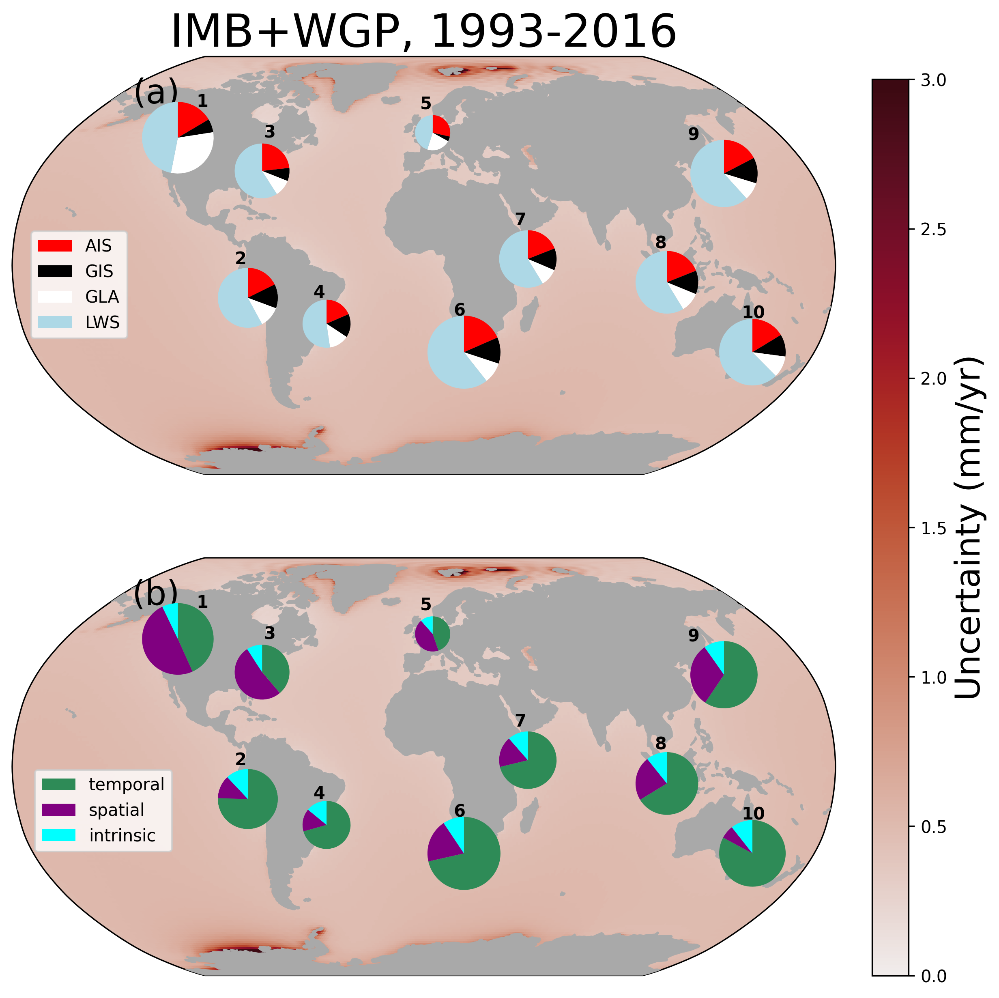

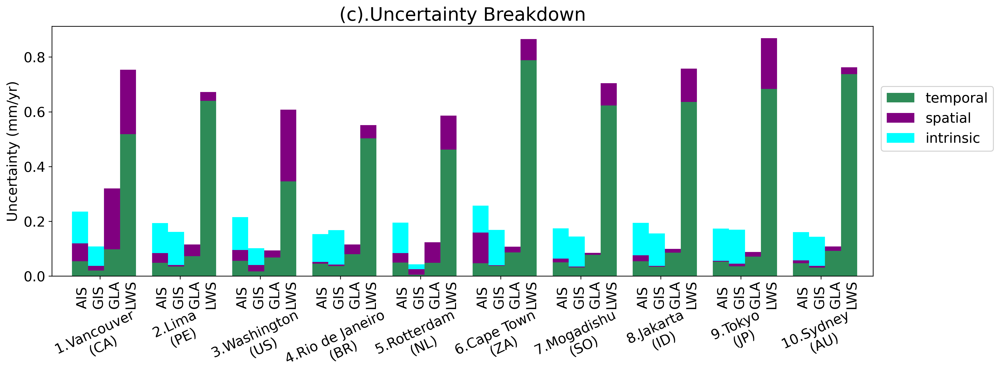

In [18]:
dpi=300
fsize=(15,10)
cmin=0
cmax=3
max_ratio = 0.75
ratio = total_unc*max_ratio/np.nanmax(total_unc)

fig = plt.figure(dpi=dpi,figsize=fsize)
proj=ccrs.PlateCarree()
proj=ccrs.Robinson()

ax = plt.subplot(211,projection=proj)
plt.title('{}, {}-{}'.format(name.split('_')[0],t0_a,t1_a-1),fontsize=fontsize+2)
ax.coastlines(resolution='110m')
ax.set_global()
ax.add_feature(cfeature.LAND,color='darkgrey',# alpha=0.5,
                    zorder=3)
splot = plt.pcolormesh(X,lat,
                   np.array(df_global[name+'_tot']).reshape(180,360),
                   transform=ccrs.PlateCarree(),
                   cmap=cmapnew,
                   vmin=cmin,vmax=cmax)
# plt.savefig('map.png')
#splot = plt.pcolormesh(X,lat,
 #                  np.array(df_global[name_trend]).reshape(180,360),
  #                 transform=ccrs.PlateCarree(),
   #                cmap=cm.cm.balance,
    #               vmin=-5,vmax=5)

ax.text(-145, 68, 
            '(a)', 
            va='center', zorder=10,
            ha='right', transform=ccrs.PlateCarree(), 
        # fontweight='bold',
       fontsize=fontsize-5)
#% %
# plt.colorbar(splot,orientation='vertical')
#cax = fig.add_axes([ax.get_position().x1+0.02,ax.get_position().y0,0.02,ax.get_position().height])
#cbar = plt.colorbar(splot, cax=cax)
#cbar.set_label(label='Trend (mm/yr)',fontsize=fontsize-5)

zip_object = zip(df['lon'], df['lat'],np.arange(1,len(df)+1), ratio)
for (lg, lt, ne, r) in zip_object:
    lonr,latr =  proj.transform_point(lg,lt, ccrs.PlateCarree())
    p=om.plot_pie_inset(df_sel3b.iloc[ne-1],lonr,latr,ax,r,
                     colors=['red','black','white','lightblue'])
    if ne==4 or ne==5:
        y_offset =12
    elif ne==6:
        y_offset = 16
    else:
        y_offset=15
    ax.text(lg - .05, lt + y_offset, 
            ne, 
            va='center', zorder=10,
            ha='right', transform=ccrs.PlateCarree(), fontweight='bold')
    if ne==2:
        labels=['AIS','GIS','GLA','LWS']
        patches, texts = plt.pie(df_sel3b.iloc[ne-1],colors=['red','black','white','lightblue'], 
                                 counterclock=False,
                                 startangle=90
                                 )
        plt.legend(patches, labels,  bbox_to_anchor=( -1,1.5))
# plt.show()

# fig = plt.figure(dpi=dpi,figsize=fsize)
ax = plt.subplot(212,projection=proj)
ax.coastlines(resolution='110m')
ax.set_global()
ax.add_feature(cfeature.LAND,color='darkgrey',# alpha=0.5,
                    zorder=3)
# plt.savefig('map.png')
splot = plt.pcolormesh(X,lat,
                   np.array(df_global[name+'_tot']).reshape(180,360),
                   transform=ccrs.PlateCarree(),
                   cmap=cmapnew,
                   vmin=cmin,vmax=cmax)


#% %
# plt.colorbar(splot,orientation='vertical')
cax = fig.add_axes([ax.get_position().x1+0.02,ax.get_position().y0,0.02,ax.get_position().height*2+0.05])
cbar = plt.colorbar(splot, cax=cax)
cbar.set_label(label='Uncertainty (mm/yr)',fontsize=fontsize-5)
ax.text(-145, 68, 
            '(b)', 
            va='center', zorder=10,
            ha='right', transform=ccrs.PlateCarree(), 
        # fontweight='bold',
       fontsize=fontsize-5)
# for b in range(len(df)):
    # lonr=xlon[b];latr=ylat[b]
   # lonr,latr =  proj.transform_point(df['lon'][b],df['lat'][b], ccrs.PlateCarree())
   # p=om.plot_pie_inset(df_sel.iloc[b],lonr,latr,ax,0.4)
    # om.plot_pie_inset(df_sel2.iloc[0][['JPL_unc_intrinsic','JPL_unc_spatial']],lonr,latr,ax,0.2)
    # df_sel2.iloc[0][['JPL_unc_temporal','JPL_unc_spatial']]

zip_object = zip(df['lon'], df['lat'],np.arange(1,len(df)+1), ratio)
for (lg, lt, ne, r) in zip_object:
    lonr,latr =  proj.transform_point(lg,lt, ccrs.PlateCarree())
    p=om.plot_pie_inset(df_sel3.iloc[ne-1],lonr,latr,ax,r)
    if ne==4 or ne==5:
        y_offset =12
    elif ne==6:
        y_offset = 16
    else:
        y_offset=15
    ax.text(lg-.05, lt + y_offset, 
            ne, 
            va='center', zorder=10,
            ha='right', transform=ccrs.PlateCarree(), fontweight='bold')
    if ne==2:
        labels=['temporal','spatial','intrinsic']
        patches, texts = plt.pie(df_sel3.iloc[ne-1],colors=['seagreen','purple','cyan'],
                                counterclock=False,
                                 startangle=90)
        plt.legend(patches, labels,  bbox_to_anchor=( -0.4,1))
plt.show()

fig.savefig(path_to_figures+'fig07_panel1.png',
             format='png',dpi=300,bbox_inches='tight')

#% % plot clustered
xlabel=['{}.{}'.format(i+1,label) for i,label in enumerate(np.array(df['label']))]

fig = om.plot_clustered_stacked([df_AIS,df_GIS,df_GLA,df_LWS],
                       labels=['AIS','GIS','GLA','LWS'],xlabel=xlabel,
                             xoffset=-0.12,
                       dpi=dpi,fsize=(16,5),title='(c).Uncertainty Breakdown',
                       color=['seagreen','purple','cyan'],
                       ylabel='Uncertainty (mm/yr)')

plt.show()

fig.savefig(path_to_figures+'fig07_panel2.png',
             format='png',dpi=300,bbox_inches='tight')


Figure 7

## SI 
No LWS:


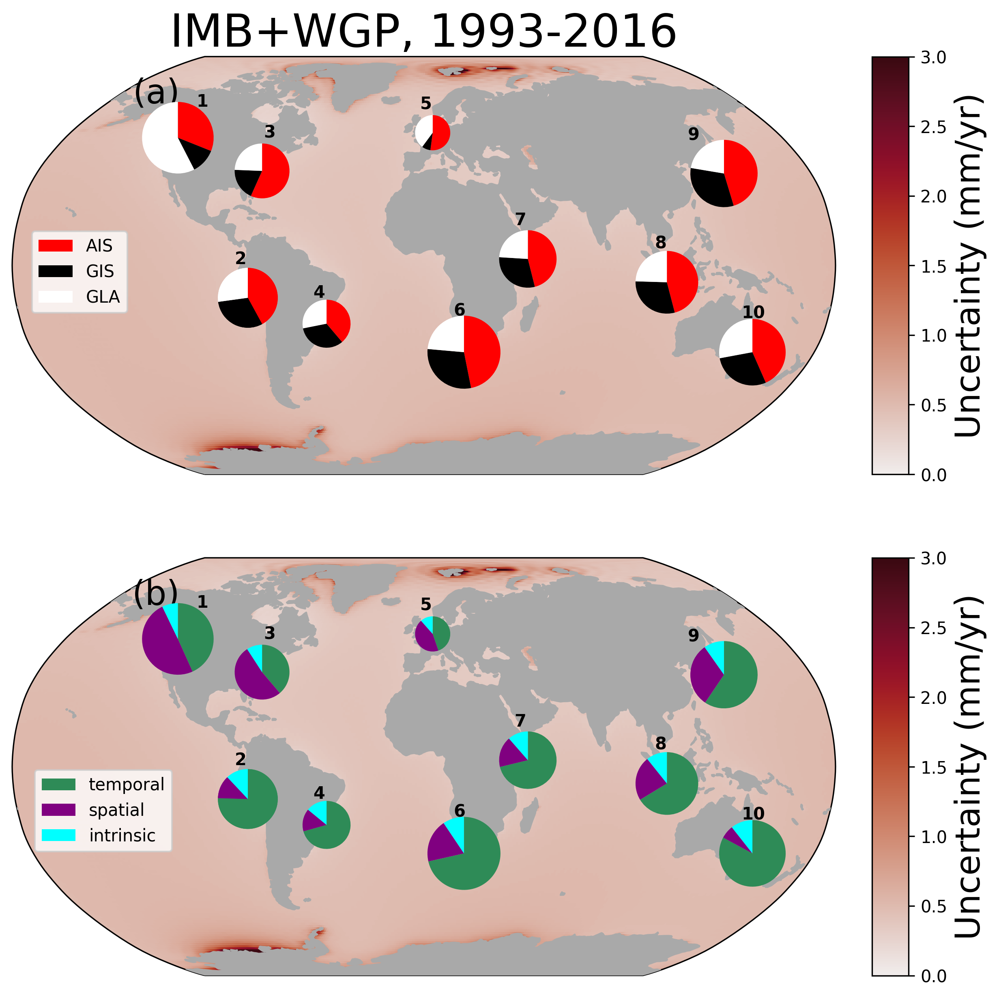

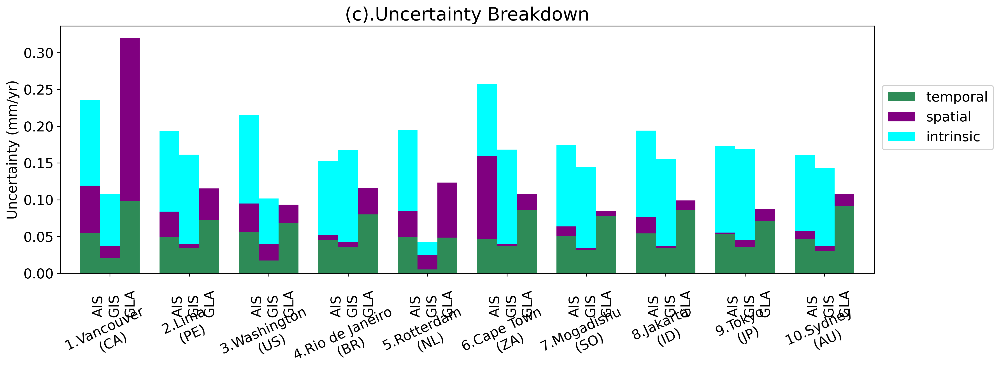

In [19]:
cnin=0
cmax=3
df= pd.read_pickle(path_a+'coastal_examples_10_{}-{}.p'.format(t0_a,t1_a))
df['label'] = ['Cape Town \n(ZA)','Jakarta \n(ID)', 'Lima \n(PE)', 'Mogadishu \n(SO)', 'Rio de Janeiro \n(BR)',
              'Rotterdam \n(NL)', 'Sydney \n(AU)', 'Tokyo \n(JP)', 'Vancouver \n(CA)', 'Washington \n(US)']
df['lon2']=om.from_360_to_180(df['lon'])
# df=df.sort_values(by=['lat','lon2'],ascending=[False,True]).reset_index()
df= df.sort_values(by=['lon2','lat'],ascending=[True,False]).reset_index()
df=df.drop('index',axis=1)

df_global=pd.read_pickle(path_a+'OM_reconstructions_{}-{}.p'.format(t0_a,t1_a))

name='IMB+WGP_unc'


df_sel=pd.DataFrame({'{}_AIS'.format(name):np.array(df['{}_AIS'.format(name)]),
                     '{}_GIS'.format(name):np.array(df['{}_GIS'.format(name)]),
                     '{}_GLA'.format(name):np.array(df['{}_GLA'.format(name)]),
                     # '{}_LWS'.format(name):np.array(df['{}_LWS'.format(name)]),
                     
                     }
                    )
total_unc = np.array(df['{}_tot'.format(name)])
name_trend = name.split('_')[0]+'_trend_tot'

lon=np.array(df_global['lon']).reshape(180,360)[0,:]
lon[-1]=360
lat=np.array(df_global['lat']).reshape(180,360)[:,0]

# path='/Volumes/LaCie_NIOZ/data/barystatic/results/{}-{}/'.format(t0,t1)
# ds=xr.open_dataset(path+'final_dataset_{}-{}.nc'.format(t0,t1))
# ds=ds.sortby('lat',ascending=True)
dataset=name.split('_')[0]
dataset0=dataset.split('+')[0]
dataset1=dataset.split('+')[1]
names=[name for name in np.array(ds.name) if name.split('_')[1]==dataset0 or 
                                             name.split('_')[1]==dataset1]

da=ds.sel(name=names)
locations = df[['lon','lat']]
llon,llat=np.meshgrid(np.array(ds.lon),np.array(-ds.lat))
# AIS
i=0
df_AIS = pd.DataFrame({ '{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
df_AIS['lon']=llon.flatten()
df_AIS['lat']=llat.flatten()
df_AIS=pd.merge(locations,df_AIS,on=['lon','lat'])
df_AIS=df_AIS.drop(['lat','lon'],axis=1)

i=i+1
df_GIS = pd.DataFrame({'{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
df_GIS['lon']=llon.flatten()
df_GIS['lat']=llat.flatten()
df_GIS=pd.merge(locations,df_GIS,on=['lon','lat'])
df_GIS=df_GIS.drop(['lat','lon'],axis=1)
i=i+1
df_GLA = pd.DataFrame({'{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
df_GLA['lon']=llon.flatten()
df_GLA['lat']=llat.flatten()
df_GLA=pd.merge(locations,df_GLA,on=['lon','lat'])
df_GLA=df_GLA.drop(['lat','lon'],axis=1)
i=i+1
df_LWS = pd.DataFrame({'{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
df_LWS['lon']=llon.flatten()
df_LWS['lat']=llat.flatten()
df_LWS=pd.merge(locations,df_LWS,on=['lon','lat'])
df_LWS=df_LWS.drop(['lat','lon'],axis=1)

unc_typ=['temporal',
         'intrinsic','spatial']
X2=np.zeros((len(unc_typ),len(df)))
for i,unc in enumerate(unc_typ):
    X2[i,:]=np.array(df['{}_{}'.format(name,unc)])
X_rel=om.get_percentage_quadra(X2)
X_rel2=om.get_percentage(X2)

df_sel2=pd.DataFrame(X_rel.T,columns=unc_typ)
df_sel3=pd.DataFrame(X_rel2.T,columns=unc_typ)
df_sel3= df_sel3[df_AIS.columns.tolist()]


regions=['AIS','GIS','GLA'# ,'LWS'
        ]
X2=np.zeros((len(regions),len(df)))
for i,unc in enumerate(regions):
    X2[i,:]=np.array(df['{}_{}'.format(name,unc)])
X_rel=om.get_percentage_quadra(X2)
X_rel2=om.get_percentage(X2)

df_sel2b=pd.DataFrame(X_rel.T,columns=regions)
df_sel3b=pd.DataFrame(X_rel2.T,columns=regions)

#%% PLOT
dpi=300
fsize=(15,10)
max_ratio = 0.75
ratio = total_unc*max_ratio/np.nanmax(total_unc)

fig = plt.figure(dpi=dpi,figsize=fsize)
proj=ccrs.PlateCarree()
proj=ccrs.Robinson()

ax = plt.subplot(211,projection=proj)
plt.title('{}, {}-{}'.format(name.split('_')[0],t0_a,t1_a-1),fontsize=fontsize+2)
ax.coastlines(resolution='110m')
ax.set_global()
ax.add_feature(cfeature.LAND,color='darkgrey',# alpha=0.5,
                    zorder=3)
# plt.savefig('map.png')
# plt.savefig('map.png')
splot = plt.pcolormesh(X,lat,
                   np.array(df_global[name+'_tot']).reshape(180,360),
                   transform=ccrs.PlateCarree(),
                   cmap=cmapnew,
                   vmin=cmin,vmax=cmax)


#% %
# plt.colorbar(splot,orientation='vertical')
cax = fig.add_axes([ax.get_position().x1+0.02,ax.get_position().y0,0.02,ax.get_position().height])
cbar = plt.colorbar(splot, cax=cax)
cbar.set_label(label='Uncertainty (mm/yr)',fontsize=fontsize-5)
ax.text(-145, 68, 
            '(a)', 
            va='center', zorder=10,
            ha='right', transform=ccrs.PlateCarree(), 
        # fontweight='bold',
       fontsize=fontsize-5)
#% %
# plt.colorbar(splot,orientation='vertical')

zip_object = zip(df['lon'], df['lat'],np.arange(1,len(df)+1), ratio)
for (lg, lt, ne, r) in zip_object:
    lonr,latr =  proj.transform_point(lg,lt, ccrs.PlateCarree())
    p=om.plot_pie_inset(df_sel3b.iloc[ne-1],lonr,latr,ax,r,
                     colors=['red','black','white','lightblue'])
    if ne==4 or ne==5:
        y_offset =12
    elif ne==6:
        y_offset = 16
    else:
        y_offset=15
    ax.text(lg - .05, lt + y_offset, 
            ne, 
            va='center', zorder=10,
            ha='right', transform=ccrs.PlateCarree(), fontweight='bold')
    if ne==2:
        labels=['AIS','GIS','GLA','LWS']
        patches, texts = plt.pie(df_sel3b.iloc[ne-1],colors=['red','black','white','lightblue'], 
                                 counterclock=False,
                                 startangle=90
                                 )
        plt.legend(patches, labels,  bbox_to_anchor=( -1,1.5))
# plt.show()

# fig = plt.figure(dpi=dpi,figsize=fsize)
ax = plt.subplot(212,projection=proj)
ax.coastlines(resolution='110m')
ax.set_global()
ax.add_feature(cfeature.LAND,color='darkgrey',# alpha=0.5,
                    zorder=3)
# plt.savefig('map.png')
splot = plt.pcolormesh(X,lat,
                   np.array(df_global[name+'_tot']).reshape(180,360),
                   transform=ccrs.PlateCarree(),
                   cmap=cmapnew,
                   vmin=cmin,vmax=cmax)


#% %
# plt.colorbar(splot,orientation='vertical')
cax = fig.add_axes([ax.get_position().x1+0.02,ax.get_position().y0,0.02,ax.get_position().height])
cbar = plt.colorbar(splot, cax=cax)
cbar.set_label(label='Uncertainty (mm/yr)',fontsize=fontsize-5)
ax.text(-145, 68, 
            '(b)', 
            va='center', zorder=10,
            ha='right', transform=ccrs.PlateCarree(), 
        # fontweight='bold',
       fontsize=fontsize-5)
# for b in range(len(df)):
    # lonr=xlon[b];latr=ylat[b]
   # lonr,latr =  proj.transform_point(df['lon'][b],df['lat'][b], ccrs.PlateCarree())
   # p=om.plot_pie_inset(df_sel.iloc[b],lonr,latr,ax,0.4)
    # om.plot_pie_inset(df_sel2.iloc[0][['JPL_unc_intrinsic','JPL_unc_spatial']],lonr,latr,ax,0.2)
    # df_sel2.iloc[0][['JPL_unc_temporal','JPL_unc_spatial']]

zip_object = zip(df['lon'], df['lat'],np.arange(1,len(df)+1), ratio)
for (lg, lt, ne, r) in zip_object:
    lonr,latr =  proj.transform_point(lg,lt, ccrs.PlateCarree())
    p=om.plot_pie_inset(df_sel3.iloc[ne-1],lonr,latr,ax,r)
    if ne==4 or ne==5:
        y_offset =12
    elif ne==6:
        y_offset = 16
    else:
        y_offset=15
    ax.text(lg-.05, lt + y_offset, 
            ne, 
            va='center', zorder=10,
            ha='right', transform=ccrs.PlateCarree(), fontweight='bold')
    if ne==2:
        labels=['temporal','spatial','intrinsic']
        patches, texts = plt.pie(df_sel3.iloc[ne-1],colors=['seagreen','purple','cyan'],
                                counterclock=False,
                                 startangle=90)
        plt.legend(patches, labels,  bbox_to_anchor=( -0.4,1))
plt.show()

fig.savefig(path_to_figures+'figA6_panel1.png',
             format='png',dpi=300,bbox_inches='tight')

#% % plot clustered
xlabel=['{}.{}'.format(i+1,label) for i,label in enumerate(np.array(df['label']))]

fig = om.plot_clustered_stacked([df_AIS,df_GIS,df_GLA],
                             xoffset=-0.06,sideoffset=0.1,
                       labels=['AIS','GIS','GLA'],xlabel=xlabel,
                       dpi=dpi,fsize=(16,5),title='(c).Uncertainty Breakdown',
                       color=['seagreen','purple','cyan'],
                       ylabel='Uncertainty (mm/yr)')

plt.show()

fig.savefig(path_to_figures+'figA6_panel2.png',
             format='png',dpi=300,bbox_inches='tight')

Figure A5

## SI - JPL

In [20]:

df= pd.read_pickle(path+'coastal_examples_10_{}-{}.p'.format(t0,t1))
df['label'] = ['Cape Town \n(ZA)','Jakarta \n(ID)', 'Lima \n(PE)', 'Mogadishu \n(SO)', 'Rio de Janeiro \n(BR)',
              'Rotterdam \n(NL)', 'Sydney \n(AU)', 'Tokyo \n(JP)', 'Vancouver \n(CA)', 'Washington \n(US)']
df['lon2']=om.from_360_to_180(df['lon'])
# df=df.sort_values(by=['lat','lon2'],ascending=[False,True]).reset_index()
df= df.sort_values(by=['lon2','lat'],ascending=[True,False]).reset_index()
df=df.drop('index',axis=1)

df_global=pd.read_pickle(path+'OM_reconstructions_{}-{}.p'.format(t0,t1))

name='JPL_unc'


df_sel=pd.DataFrame({'{}_AIS'.format(name):np.array(df['{}_AIS'.format(name)]),
                     '{}_GIS'.format(name):np.array(df['{}_GIS'.format(name)]),
                     '{}_GLA'.format(name):np.array(df['{}_GLA'.format(name)]),
                     '{}_LWS'.format(name):np.array(df['{}_LWS'.format(name)]),
                     
                     }
                    )
total_unc = np.array(df['{}_tot'.format(name)])
name_trend = name.split('_')[0]+'_trend_tot'

lon=np.array(df_global['lon']).reshape(180,360)[0,:]
lon[-1]=360
lat=np.array(df_global['lat']).reshape(180,360)[:,0]

# path='/Volumes/LaCie_NIOZ/data/barystatic/results/{}-{}/'.format(t0,t1)
# ds=xr.open_dataset(path+'final_dataset_{}-{}.nc'.format(t0,t1))
# ds=ds.sortby('lat',ascending=True)
dataset=name.split('_')[0]
names=[name for name in np.array(ds.name) if name.split('_')[1]==dataset]

da=ds.sel(name=names)
locations = df[['lon','lat']]
llon,llat=np.meshgrid(np.array(ds.lon),np.array(-ds.lat))
# AIS
i=0
df_AIS = pd.DataFrame({ '{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
df_AIS['lon']=llon.flatten()
df_AIS['lat']=llat.flatten()
df_AIS=pd.merge(locations,df_AIS,on=['lon','lat'])
df_AIS=df_AIS.drop(['lat','lon'],axis=1)

i=i+1
df_GIS = pd.DataFrame({'{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
df_GIS['lon']=llon.flatten()
df_GIS['lat']=llat.flatten()
df_GIS=pd.merge(locations,df_GIS,on=['lon','lat'])
df_GIS=df_GIS.drop(['lat','lon'],axis=1)
i=i+1
df_GLA = pd.DataFrame({'{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
df_GLA['lon']=llon.flatten()
df_GLA['lat']=llat.flatten()
df_GLA=pd.merge(locations,df_GLA,on=['lon','lat'])
df_GLA=df_GLA.drop(['lat','lon'],axis=1)
i=i+1
df_LWS = pd.DataFrame({'{}'.format(unc):np.array(da.uncs.sel(name=names[i])[ind]).flatten() for ind,unc in enumerate(np.array(ds.unc_type))})
df_LWS['lon']=llon.flatten()
df_LWS['lat']=llat.flatten()
df_LWS=pd.merge(locations,df_LWS,on=['lon','lat'])
df_LWS=df_LWS.drop(['lat','lon'],axis=1)

unc_typ=['temporal',
         'intrinsic','spatial']
X2=np.zeros((len(unc_typ),len(df)))
for i,unc in enumerate(unc_typ):
    X2[i,:]=np.array(df['{}_{}'.format(name,unc)])
X_rel=om.get_percentage_quadra(X2)
X_rel2=om.get_percentage(X2)

df_sel2=pd.DataFrame(X_rel.T,columns=unc_typ)
df_sel3=pd.DataFrame(X_rel2.T,columns=unc_typ)
df_sel3= df_sel3[df_AIS.columns.tolist()]


regions=['AIS','GIS','GLA','LWS']
X2=np.zeros((len(regions),len(df)))
for i,unc in enumerate(regions):
    X2[i,:]=np.array(df['{}_{}'.format(name,unc)])
X_rel=om.get_percentage_quadra(X2)
X_rel2=om.get_percentage(X2)

df_sel2b=pd.DataFrame(X_rel.T,columns=regions)
df_sel3b=pd.DataFrame(X_rel2.T,columns=regions)



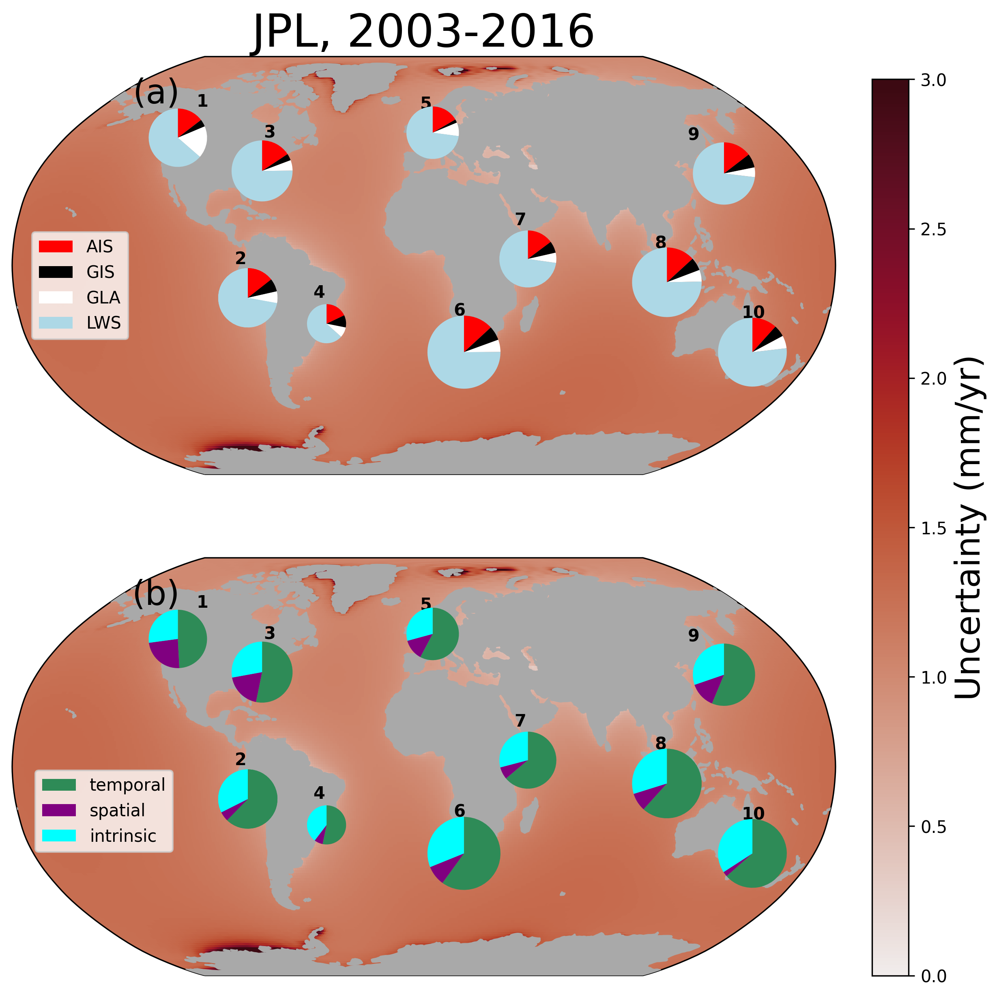

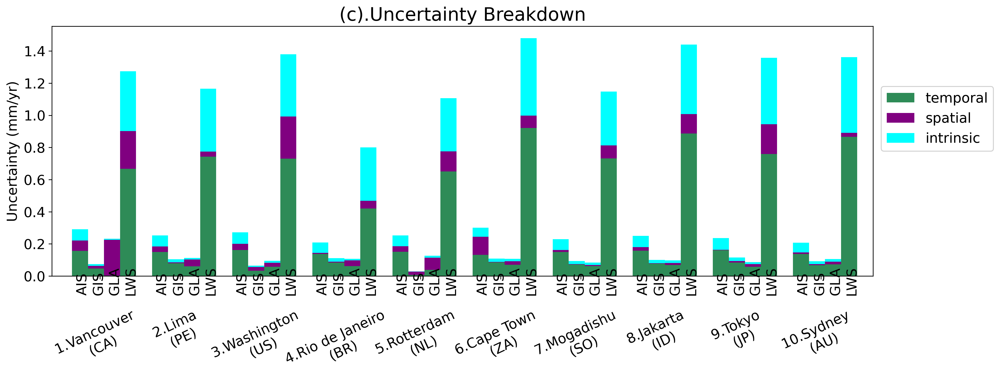

In [21]:
dpi=300
fsize=(15,10)
cmin=0
cmax=3
max_ratio = 0.75
ratio = total_unc*max_ratio/np.nanmax(total_unc)

fig = plt.figure(dpi=dpi,figsize=fsize)
proj=ccrs.PlateCarree()
proj=ccrs.Robinson()

ax = plt.subplot(211,projection=proj)
plt.title('{}, {}-{}'.format(name.split('_')[0],t0,t1),fontsize=fontsize+2)
ax.coastlines(resolution='110m')
ax.set_global()
ax.add_feature(cfeature.LAND,color='darkgrey',# alpha=0.5,
                    zorder=3)
splot = plt.pcolormesh(X,lat,
                   np.array(df_global[name+'_tot']).reshape(180,360),
                   transform=ccrs.PlateCarree(),
                   cmap=cmapnew,
                   vmin=cmin,vmax=cmax)
# plt.savefig('map.png')
#splot = plt.pcolormesh(X,lat,
 #                  np.array(df_global[name_trend]).reshape(180,360),
  #                 transform=ccrs.PlateCarree(),
   #                cmap=cm.cm.balance,
    #               vmin=-5,vmax=5)

ax.text(-145, 68, 
            '(a)', 
            va='center', zorder=10,
            ha='right', transform=ccrs.PlateCarree(), 
        # fontweight='bold',
       fontsize=fontsize-5)
#% %
# plt.colorbar(splot,orientation='vertical')
#cax = fig.add_axes([ax.get_position().x1+0.02,ax.get_position().y0,0.02,ax.get_position().height])
#cbar = plt.colorbar(splot, cax=cax)
#cbar.set_label(label='Trend (mm/yr)',fontsize=fontsize-5)

zip_object = zip(df['lon'], df['lat'],np.arange(1,len(df)+1), ratio)
for (lg, lt, ne, r) in zip_object:
    lonr,latr =  proj.transform_point(lg,lt, ccrs.PlateCarree())
    p=om.plot_pie_inset(df_sel3b.iloc[ne-1],lonr,latr,ax,r,
                     colors=['red','black','white','lightblue'])
    if ne==4 or ne==5:
        y_offset =12
    elif ne==6:
        y_offset = 16
    else:
        y_offset=15
    ax.text(lg - .05, lt + y_offset, 
            ne, 
            va='center', zorder=10,
            ha='right', transform=ccrs.PlateCarree(), fontweight='bold')
    if ne==2:
        labels=['AIS','GIS','GLA','LWS']
        patches, texts = plt.pie(df_sel3b.iloc[ne-1],colors=['red','black','white','lightblue'], 
                                 counterclock=False,
                                 startangle=90
                                 )
        plt.legend(patches, labels,  bbox_to_anchor=( -1,1.5))
# plt.show()

# fig = plt.figure(dpi=dpi,figsize=fsize)
ax = plt.subplot(212,projection=proj)
ax.coastlines(resolution='110m')
ax.set_global()
ax.add_feature(cfeature.LAND,color='darkgrey',# alpha=0.5,
                    zorder=3)
# plt.savefig('map.png')
splot = plt.pcolormesh(X,lat,
                   np.array(df_global[name+'_tot']).reshape(180,360),
                   transform=ccrs.PlateCarree(),
                   cmap=cmapnew,
                   vmin=cmin,vmax=cmax)


#% %
# plt.colorbar(splot,orientation='vertical')
cax = fig.add_axes([ax.get_position().x1+0.02,ax.get_position().y0,0.02,ax.get_position().height*2+0.05])
cbar = plt.colorbar(splot, cax=cax)
cbar.set_label(label='Uncertainty (mm/yr)',fontsize=fontsize-5)
ax.text(-145, 68, 
            '(b)', 
            va='center', zorder=10,
            ha='right', transform=ccrs.PlateCarree(), 
        # fontweight='bold',
       fontsize=fontsize-5)
# for b in range(len(df)):
    # lonr=xlon[b];latr=ylat[b]
   # lonr,latr =  proj.transform_point(df['lon'][b],df['lat'][b], ccrs.PlateCarree())
   # p=om.plot_pie_inset(df_sel.iloc[b],lonr,latr,ax,0.4)
    # om.plot_pie_inset(df_sel2.iloc[0][['JPL_unc_intrinsic','JPL_unc_spatial']],lonr,latr,ax,0.2)
    # df_sel2.iloc[0][['JPL_unc_temporal','JPL_unc_spatial']]

zip_object = zip(df['lon'], df['lat'],np.arange(1,len(df)+1), ratio)
for (lg, lt, ne, r) in zip_object:
    lonr,latr =  proj.transform_point(lg,lt, ccrs.PlateCarree())
    p=om.plot_pie_inset(df_sel3.iloc[ne-1],lonr,latr,ax,r)
    if ne==4 or ne==5:
        y_offset =12
    elif ne==6:
        y_offset = 16
    else:
        y_offset=15
    ax.text(lg-.05, lt + y_offset, 
            ne, 
            va='center', zorder=10,
            ha='right', transform=ccrs.PlateCarree(), fontweight='bold')
    if ne==2:
        labels=['temporal','spatial','intrinsic']
        patches, texts = plt.pie(df_sel3.iloc[ne-1],colors=['seagreen','purple','cyan'],
                                counterclock=False,
                                 startangle=90)
        plt.legend(patches, labels,  bbox_to_anchor=( -0.4,1))
plt.show()

fig.savefig(path_to_figures+'figA5_panel1.png',
             format='png',dpi=300,bbox_inches='tight')

#% % plot clustered
xlabel=['{}.{}'.format(i+1,label) for i,label in enumerate(np.array(df['label']))]

fig = om.plot_clustered_stacked([df_AIS,df_GIS,df_GLA,df_LWS],
                       labels=['AIS','GIS','GLA','LWS'],xlabel=xlabel,
                             xoffset=-0.12,
                       dpi=dpi,fsize=(16,5),title='(c).Uncertainty Breakdown',
                       color=['seagreen','purple','cyan'],
                       ylabel='Uncertainty (mm/yr)')

plt.show()

fig.savefig(path_to_figures+'figA5_panel2.png',
             format='png',dpi=300,bbox_inches='tight')


Figure A4

In [22]:


#%% mask
mask=xr.open_dataset('/Volumes/LaCie_NIOZ/PhD/Barystatic/GRACE/mascons/JPL/global/LAND_MASK.CRI_360x180.nc')
# mask.land_mask.plot()
mask=mask.sortby('lat',ascending=False)
oceanmask=np.array(mask.land_mask)
oceanmask[oceanmask>0]=np.nan
oceanmask[oceanmask==0]=1
#%%
t0=2003
t1=2016
# path = '/Volumes/LaCie_NIOZ/data/barystatic/results/{}-{}/'.format(t0,t1)
# # path = '/Users/ccamargo/Desktop/'
# ds=xr.open_dataset(path+'final_dataset_{}-{}.nc'.format(t0,t1))

path = '/Volumes/LaCie_NIOZ/data/barystatic/revisions/'
df=pd.read_pickle(path+'global/final_combos-{}-{}_v2.p'.format(t0,t1))

df_reg = pd.read_pickle(path+'results/{}-{}/OM_reconstructions_{}-{}.p'.format(t0,t1,t0,t1))

dimlat=180;dimlon=360
lon=np.array(df_reg['lon']).reshape(dimlat,dimlon)[0,:]
lat=np.array(df_reg['lat']).reshape(dimlat,dimlon)[:,0]

reg_trend=np.zeros((len(df['combinations'])))
# reg_trend_ols=np.full_like(reg_trend,0)
reg_unc=np.full_like(reg_trend,0)

for i,combo in enumerate(np.array(df['combinations'])):
    reg_trend[i],_,_=om.reg_to_glb(np.array(df_reg[combo+'_trend_tot']).reshape(dimlat,dimlon),lat,lon)
    reg_unc[i],_,_=om.reg_to_glb(np.array(df_reg[combo+'_unc_tot']).reshape(dimlat,dimlon),lat,lon)
    # reg_trend_ols[i],_,_=om.reg_to_glb(np.array(df_reg_ols[combo+'_trend_tot']).reshape(dimlat,dimlon),lat,lon)

df['reg_trend_nm'] = reg_trend
# df['reg_trend_ols'] = df_reg_ols['trend']
df['reg_unc'] = reg_unc

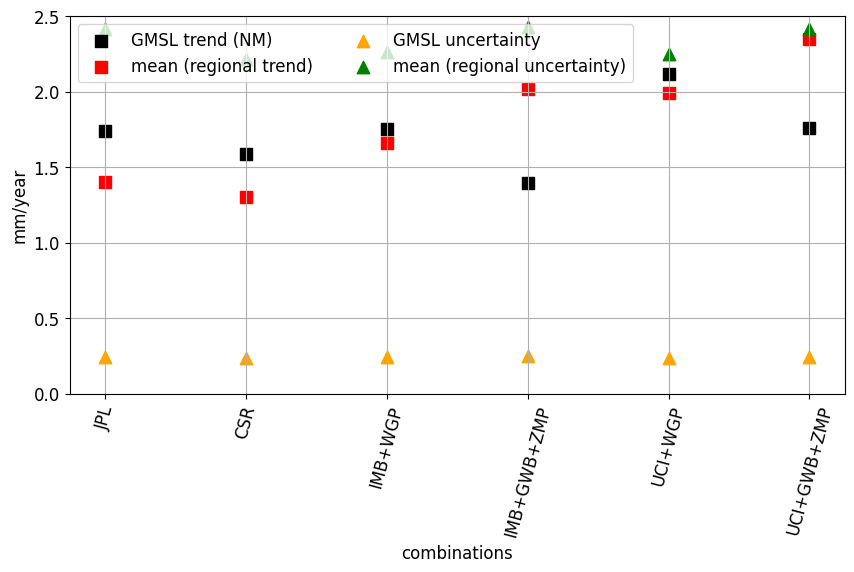

In [23]:
col = ['trend','reg_trend_nm',
       # 'trend_OLS','reg_trend_ols',
       'total_unc','reg_unc',
       # 'temp_unc',
       ]
labels = ['GMSL trend (NM)', 'mean (regional trend)', 
          # 'gmsl trend (OLS)','mean(regional trend(OLS))', 
          'GMSL uncertainty','mean (regional uncertainty)' ,
           ]
color = {1:'black', 
         2:'red', 
         3:'orange', 
         4:'green'
        }
fig=plt.figure(figsize=(10,5),dpi=100,facecolor='w')

syb=['s','s',
     # 'd','d',
     "^",'^','v','*','D','X','X','X']
ax=plt.subplot(111)
for i,c in enumerate(col):
    df.plot.scatter(x='combinations',y=c,ax=ax,
                    marker=syb[i],
                    s=80,
#                     color=col_dict[i+1],
                    color=color[i+1],
                    label=labels[i])
plt.legend(loc='upper left',ncol=int(len(labels)/2),fontsize=12)
plt.ylim([0,2.5])
plt.xticks(np.arange(0,len(df['combinations'])),
           df['combinations'],
           rotation=75,fontsize=12)
plt.yticks(fontsize=12)
plt.ylabel('mm/year',fontsize=12)
plt.xlabel('combinations',fontsize=12)
plt.grid()
plt.show()
#%%
fig.savefig(path_to_figures+'figA4.png',
             format='png',dpi=300,bbox_inches='tight')
plt.close()


Figure A3

# GMSL

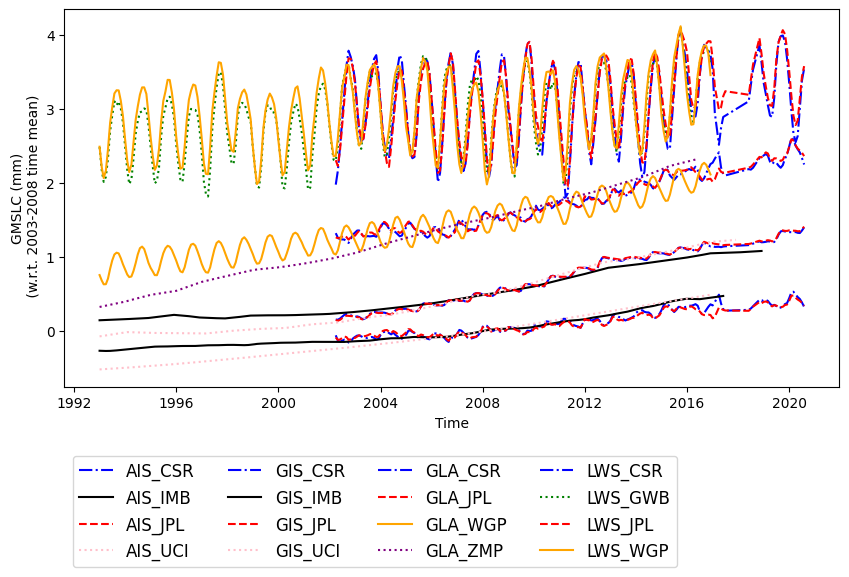

In [24]:
path='/Volumes/LaCie_NIOZ/data/barystatic/revisions/input_data/'
ds = xr.open_dataset(path+'gmsl.nc')
ds = ds.sortby(ds.names)

col_dic = {'JPL':{'col':'red','sty':'--'},
          'CSR':{"col":'blue','sty':'-.'},
          'IMB':{'col':'black','sty':'-'},
          'WGP':{'col':'orange','sty':'-'},
          'GWB':{'col':'green','sty':':'},
          'ZMP':{'col':'purple','sty':':'},
          'UCI':{'col':'pink','sty':':'}
          }
offsets = {'AIS':0,
          'GIS':0.5,
          'LWS':3,
          'GLA':1.5}


x = np.array(ds.time)
y = np.array(ds.gmsl/10)
names = np.array(ds.names)
fig=plt.figure(figsize=(10,5),dpi=100,facecolor='w')

ax=plt.subplot(111)
for i,name in enumerate(names):
    reg,n = name.split('_')
    c = col_dic[n]['col']
    s = col_dic[n]['sty']
    offset = offsets[reg]
    plt.plot(x,y[i]+offset,c=c,linestyle=s,# linewidth=2,
             label=name)
plt.legend(loc='lower left',ncol=4,fontsize=12,
          bbox_to_anchor=(0.,- 0.5),)

plt.ylabel('GMSLC (mm)\n (w.r.t. 2003-2008 time mean)')
plt.xlabel('Time')

plt.show()

In [25]:
#%%
fig.savefig(path_to_figures+'gmsl.png',
             format='png',dpi=300,bbox_inches='tight')


#%% fig 1 

fig = plt.figure(figsize=(wi, hi), 
                 facecolor='w')
nrows=4
ncols=4

gs = GridSpec(nrows, ncols)
alpha=0.9
names=['AIS_CSR', 'GIS_CSR', 'GLA_CSR','LWS_CSR',
       'AIS_JPL', 'GIS_JPL', 'GLA_JPL','LWS_JPL',
        'AIS_IMB', 'GIS_IMB','GLA_WGP','LWS_WGP',
       'AIS_UCI', 'GIS_UCI','GLA_ZMP','LWS_GWB' ]
c=['black','palegoldenrod','lightpink','orange','teal','darkmagenta','skyblue','crimson']
for iname,name in enumerate(names):
    da=ds.sel(names=name)
    reg = name.split('_')[0]
    
    ax1 = plt.subplot(gs[iname])
    plt.title('\n({}). '.format(letters[iname])+name,fontsize=18)

    data_b = np.array(da['nm_sel']).flatten()
    data_b= data_b[np.isfinite(data_b)]
    d = {name:data_b}
    # sns.histplot(d,stat='density')
    x = np.arange(0,8)
    options = np.arange(0,8)
    count=len(data_b)
    for i in range(len(options)):
        options[i] = len(data_b[data_b==i])*100/count

    plt.bar(x,options,color=c)
    #plt.scatter(x,options,color='black')

#% %
plt.show()

import seaborn as sns
import sys
sys.path.append("/Users/ccamargo/Documents/py_scripts/")
import utils_SL as sl 

periods =[#(2005,2016),(1993,2018),
          (2003,2017)
          ]
for period in periods:
    t0=period[0]
    t1=period[1]-1
    
    pwd = '/Volumes/LaCie_NIOZ/data/barystatic/revisions/hector/'
    
    pwd = pwd+'{}-{}/'.format(t0,t1)

    flist=sl.get_filelist(pwd+'ranking/regional/','*.nc')
    name=[None]*len(flist)
    ifile=11;file=flist[ifile]

    dimlat=180;dimlon=360
    nrows=4
    ncols=4
    wi=20;hi=15
    for score in [#'aic','bic',
                  'bic_tp'
                  ]:
        fig = plt.figure(figsize=(wi, hi), 
                     facecolor='w')
    
        gs = GridSpec(nrows, ncols)
        for ifile, file in enumerate(flist):
            ds=xr.open_dataset(file)
            name = file.split('/')[-1].split('.nc')[0]
            data = {}
            for i, nm in enumerate(np.array(ds.nm)):
                datab = np.array(ds[score][i])
                datab = datab[np.isfinite(datab)]
                datab = datab[datab>0]
                data[nm] = datab
            
            ax1 = plt.subplot(gs[ifile])
            # if name in ['AIS_IMB','AIS_UCI','GIS_IMB','GIS_UCI']:
            #     mode='layer'
            # else:
            #     mode='stack'
            sns.histplot(data,
                          multiple='stack',
                         # stat='density'
                         )
            plt.title(name)
        plt.show()

#%%
fig.savefig(path_to_figures+'figA1.png',
             format='png',dpi=300,bbox_inches='tight')